# Óscar Mateos López - Clasificación musical con DL
Reconocimiento de estilos musicales en audio mediante Deep Learning


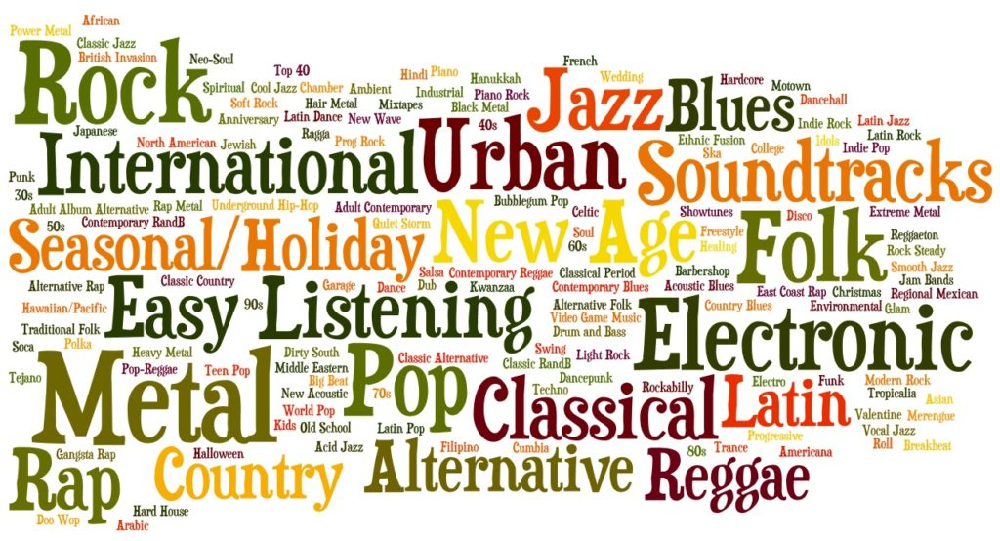

# **Introducción**


En este proyecto se implementará en Keras un clasificador de géneros musicales a partir de muestras de 30 segundos de canciones etiquetadas a partir de un conocido datset (**GTZAN**) [2] que incluye **1000 muestras** (**10 estilos musicales, 100 muestras por estilo**). 

La clasificación de géneros musicales a partir de la forma de onda de una canción es un tema cásico de MIR (**Music Information Retrieval**), los datos pasarán por una fase de pre-procesado [1] para posteriormente utilizarse como entradas a los modelos DL que se verán durante el proyecto.

Se verá el proceso completo para generar los clasificadores a partir de los ficheros audio wav originales de un conocido dataset: 
- Introducción de los **conceptos básicos** utilizados para generar los datos de entrada.
- **Preprocesado** de los datos (extracción de los espectrogramas de Mel y los MFFC) y enriquecimiento de los datasets obtenidos mediante **Data Augmentation**.
- Generación y comparación de varios **modelos** (MLP, CNN y LSTM).
- **Conclusiones** sobre los resultados y posibles ideas para mejorar.


## **Conceptos básicos para entender los datos de entrada a los modelos**


- **Conversión analogico a digital (sonido, ADC):** Sampling VS Quantization; Trabajaremos sobre datos digitales que provienen de una conversión de datos analógicos. La señal continua se muestrea en intervalos de tiempo uniformes y la amplitud de la onda se cuantifica con un número limitado de bits (por ejemplo la calidad de CD: Sample rate 44,100Hz, Bit depth 16 bits/canal).
- **Waveform:** Representa la amplitud de una onda en el tiempo, en nuestro dataset original son los 1000 fragmentos de 30 segundos previamente clasificados en subdirectorios.
- **Amplitud VS Frecuencia:** Para extraer características de las formas de onda necesitamos pasar del dominio de la amplitud al dominio de las frecuencias, donde mediremos la magnitud alcanzada a distintas frecuencias.
  - **Transformada de Fourier:** Descomposicion de sonido complejo en la suma de varias ondas a diferentes frecuencias. Nos interesan las amplitudes de ondas: Nos indican el nivel de contribución de cada onda a la onda compleja.<br>Se transforma del dominio del tiempo al de las frecuencias, perdemos la información temporal.
  - **Transformada de Fourier de Tiempo Reducido (Short-time Fourier transform, STFT):**  Calcula varias FFTs en distintos intervalos (ventana de N muestras). Preserva información temporal.
- **Cepstrum melódico de frecuencia (Mel-Frequency Cepstral Coefficients):** También llamados Coeﬁcientes Cepstrales en las Frecuencias de Mel, aportan información del ritmo de cambio de las diferentes bandas de un espectro, es usado como un vector de características para representar la voz humana y las señales de música. Capturan aspectos del timbre y la '*textura*' del sonido. En el dominio de la frecuencia.
  - Fue originalmente desarrollado para caracterizar los ecos de las ondas tectónicas, que provenían de terremotos y explosiones. 
  - También se utilizaba para analizar las señales captadas por un radar.
  - La palabra "*Cepstrum*" es un anagrama de la palabra "*Spectrum*". Invierte el orden de las primeras cuatro letras, reforzando la idea de inversa del spectrum.
- **Enfoque tradicional (ML) VS Enfoque moderno (DL)**, donde había que realizar la extracción de características (Feat. engineering) mediante diferentes técnicas VS extracción automática desde los **MFCCs** y las representaciones de los **espectrogramas de Mel**.

# Montar la unidad de Google Drive donde está el dataset musical


In [1]:
pip install split-folders

In [2]:
pip install audiomentations | grep -v 'already satisfied'

In [13]:
# Librerias usadas
import librosa, librosa.display, IPython
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os, glob, math, json
from google.colab import drive
import splitfolders
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift
import soundfile as sf
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import tensorflow as tf
from keras import Sequential
from keras.layers import Flatten, Dense, Dropout, Conv2D, MaxPooling2D, GlobalMaxPool2D, AveragePooling2D, GlobalAveragePooling2D, BatchNormalization, LeakyReLU, LSTM
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.metrics import classification_report, roc_curve, auc
from keras.optimizers import Adam, RMSprop

In [4]:
# Variables globales
DRIVE_PATH = "/content/drive"
DATASET_PATH = "drive/MyDrive/GTZAN"
SPLIT_SETS_PATH = "drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav"
JSON_PATH = "drive/Shareddrives/UCM SHARED/GTZAN_Colab/json"
JSON_FILENAME = "data.json"
PNG_PATH = "drive/Shareddrives/UCM SHARED/GTZAN_Colab/png"

In [6]:
# Montar mi unidad de Drive y la ruta donde está el Dataset Gitzen
drive.mount(DRIVE_PATH)

Mounted at /content/drive


In [7]:
ls drive/MyDrive/GTZAN/

blues/      country/  hiphop/  metal/  reggae/
classical/  disco/    jazz/    pop/    rock/


In [8]:
# Comprobación del numero de muestras wav correcto 
def check_directories(data_path):
  total=0

  for i, (dirpath, dirnames, filenames) in enumerate(os.walk(data_path)):
      if len(filenames) > 0:
        count_wav = len(glob.glob1(dirpath,"*wav"))
        print("Directorio: {}, Número de ficheros wav: {}".format(dirpath, count_wav))
        total+= count_wav

  print("Total: ",total)

In [9]:
check_directories(DATASET_PATH)

Directorio: drive/MyDrive/GTZAN/blues, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/classical, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/country, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/hiphop, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/disco, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/metal, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/jazz, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/pop, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/reggae, Número de ficheros wav: 100
Directorio: drive/MyDrive/GTZAN/rock, Número de ficheros wav: 100
Total:  1000


# Visualización (y escuchado) de datos inicial: Comparación de diferentes estilos
Utilizaremos princialmente la librería de análisis musical y de audio LibROSA [7].

## Exploración de ficheros para uno de los estilos

In [10]:
# Cargamos un archivo de audio wav como una serie temporal(default sr=22050) para cada 3 estilos de ejemplo
file_blues = "drive/MyDrive/GTZAN/blues/blues.00000.wav"
file_classical = "drive/MyDrive/GTZAN/classical/classical.00000.wav"
file_metal = "drive/MyDrive/GTZAN/metal/metal.00000.wav"

audio_data_blues, sr = librosa.load(file_blues)
audio_data_classical, sr = librosa.load(file_classical)
audio_data_metal, sr = librosa.load(file_metal)

In [ ]:
# Play audio_data blues
IPython.display.Audio(audio_data_blues, rate=sr)

In [ ]:
# Play audio_data classical
IPython.display.Audio(audio_data_classical, rate=sr)

In [ ]:
# Play audio_data metal
IPython.display.Audio(audio_data_metal, rate=sr)

## Comparación de las ondas (waveforms)
Ploteamos la onda completa (30s) para las 3 muestras de estos 3 géneros.

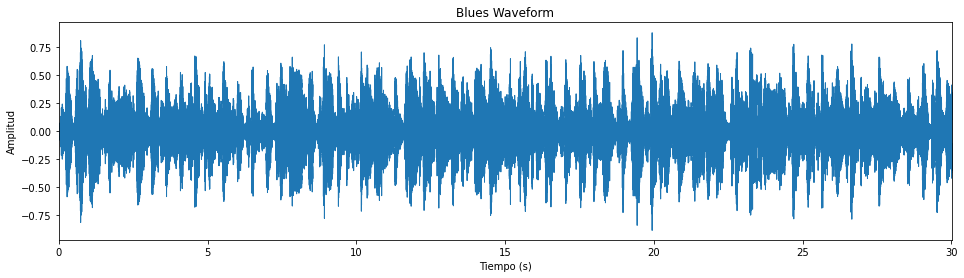

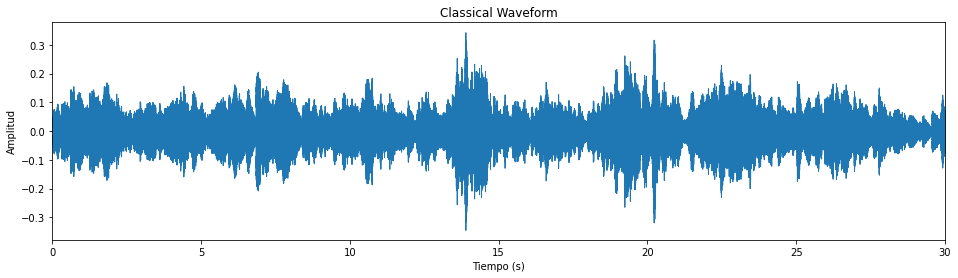

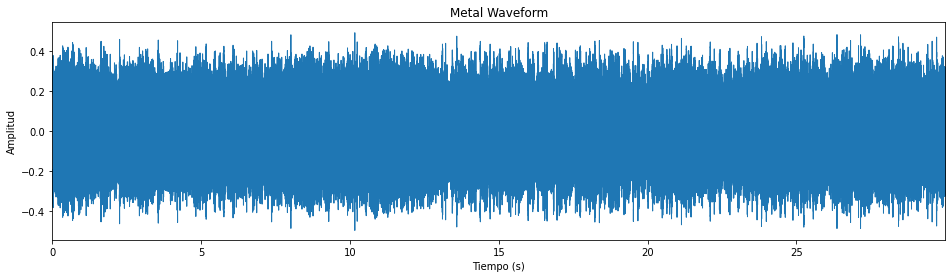

In [ ]:
# Blues
plt.figure(figsize=(16, 4))
librosa.display.waveplot(audio_data_blues, sr)
plt.title("Blues Waveform")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# Classical
plt.figure(figsize=(16, 4))
librosa.display.waveplot(audio_data_classical, sr)
plt.title("Classical Waveform")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# Metal
plt.figure(figsize=(16, 4))
librosa.display.waveplot(audio_data_metal, sr)
plt.title("Metal Waveform")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()


## Obtención del espectro de potencia (FFT)
Lo veremos para la canción de blues de ejemplo.

In [ ]:
# FFT (Transformada de Fourier), para obtener el espectro (Spectrum), ejemplo blues
# Array de complejos
fft = np.fft.fft(audio_data_blues)
fft

array([-39.49905396-7.46069873e-14j, -18.64591868+3.67946888e-01j,
       -18.55041851+7.65147152e-02j, ..., -18.52902335+3.12934891e-02j,
       -18.55041851-7.65147152e-02j, -18.64591868-3.67946888e-01j])

In [ ]:
type(fft[0])

numpy.complex128

In [ ]:
# Obtenemos la magnitud del fft
# Son las contribuciones de cada frecuencia a la onda general
magnitude = np.absolute(fft)
magnitude

array([39.49905396, 18.64954874, 18.55057631, ..., 18.52904978,
       18.55057631, 18.64954874])

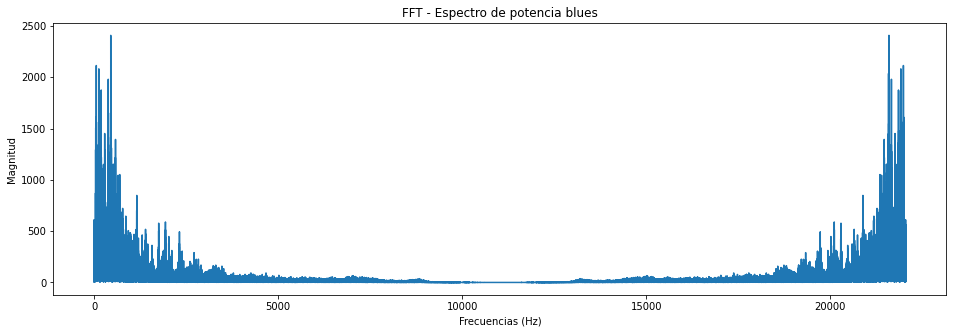

In [ ]:
# Plotear las magnitudes
# Generamos el eje de frecuencias
frequency = np.linspace(0, sr, len(magnitude))

plt.figure(figsize=(16, 5))
plt.plot(frequency, magnitude)
plt.title("FFT - Espectro de potencia blues")
plt.xlabel("Frecuencias (Hz)")
plt.ylabel("Magnitud")
plt.show()

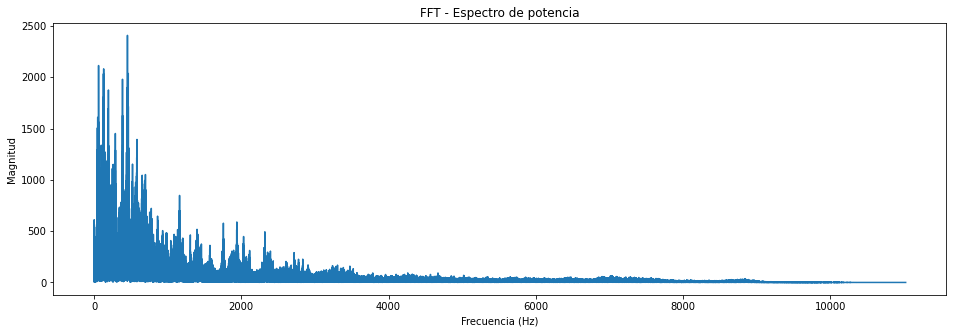

In [ ]:
# Power Spectrum
# La transformada de Fourier de cualquier señal tiene un número igual de frecuencias positivas que negativas, P(ω)=P(-ω)
# Por esto la grafica es simetrica: Solo necesitamos fijarnos en la primera mitad 
# La mayoría de la energia se concentra en las frecuencias bajas

left_frequency = frequency[:int(len(frequency)/2)]
plt.figure(figsize=(16, 5))
plt.plot(left_frequency, magnitude[:int(len(frequency)/2)])
plt.title("FFT - Espectro de potencia")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.show()

## Obtención del espectrograma (STFT)
Lo veremos para la canción de blues de ejemplo.

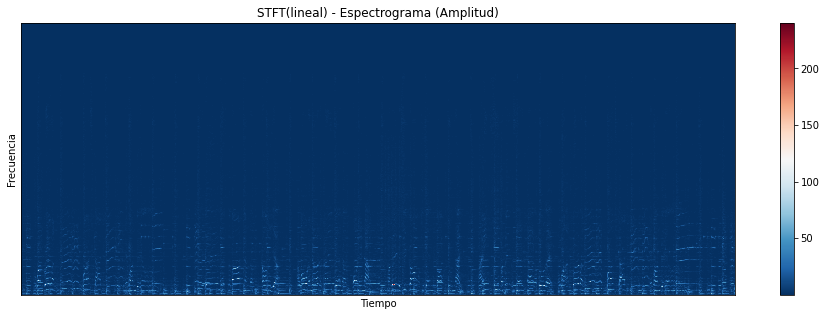

In [ ]:
# STFT (Transformada de Fourier de Tiempo reducido), para obtener el espectrograma (Spectrogram)
# Definimos la ventana (# de muestras)
n_fft = 2048
# Desplazamiento de la ventana (# de muestras hacia adelante)
hop_length = 512

stft = librosa.core.stft(audio_data_blues, n_fft=n_fft, hop_length=hop_length)
# Obtenemos magnitudes (Array de complejos)
spectrogram = np.abs(stft)

# Plotear STFT, usamos specshow para representar el espectrograma, es similar a un heatmap
# Se muestran muy bajas amplitudes, por lo que casi no se perciben en la grafica
plt.figure(figsize=(16, 5))
librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, cmap="RdBu_r")
plt.title("STFT(lineal) - Espectrograma (Amplitud)")
plt.xlabel("Tiempo")
plt.ylabel("Frecuencia")
plt.colorbar()
plt.show()

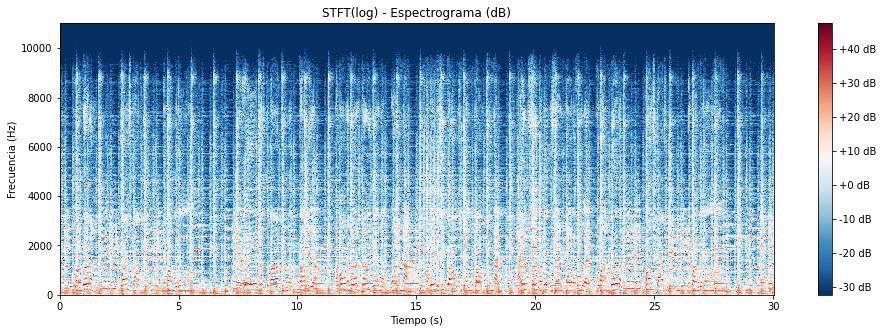

In [ ]:
# La sonoridad (loudness) se percibe en dB, por lo que hacemos el cambio de lineal a escala logarítmica y reploteamos
log_spectrogram = librosa.amplitude_to_db(spectrogram)

# La mayor parte de la energía se concentra en las bajas frecuencias
# El espectrograma es bastante estable a lo largo del tiempo
plt.figure(figsize=(16, 5))
librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, x_axis="time", y_axis="hz", cmap="RdBu_r")
plt.title("STFT(log) - Espectrograma (dB)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.colorbar(format='%+1.0f dB')
plt.show()

### Representación del Espectrograma de Mel
También se puede representar el espectrograma en la **escala de las frecuencias de Mel, mucho más apropiadas para la percepción auditiva humana**. Utilizaremos los plots (representaciones gráficas) guardados como ficheros sin compresión PNG. 

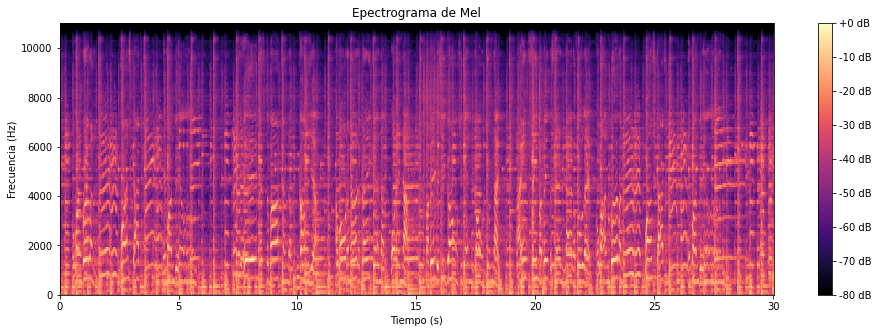

In [ ]:
# Visualizacion como Mel-Spectogram
melSpec = librosa.feature.melspectrogram(audio_data_blues, sr=sr, n_mels=128)
melSpec_dB = librosa.power_to_db(melSpec, ref=np.max)

plt.figure(figsize=(16, 5))
librosa.display.specshow(melSpec_dB, sr=sr, x_axis="time", y_axis="hz")
plt.title("Epectrograma de Mel")
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.colorbar(format='%+1.0f dB')
plt.show()

## Obtención de los Coeﬁcientes Cepstrales en las Frecuencias de Mel (MFCC)
Afortunadamente la librería LibROSA incluye una función para generarlos directamente desde la secuencia wav cargada.

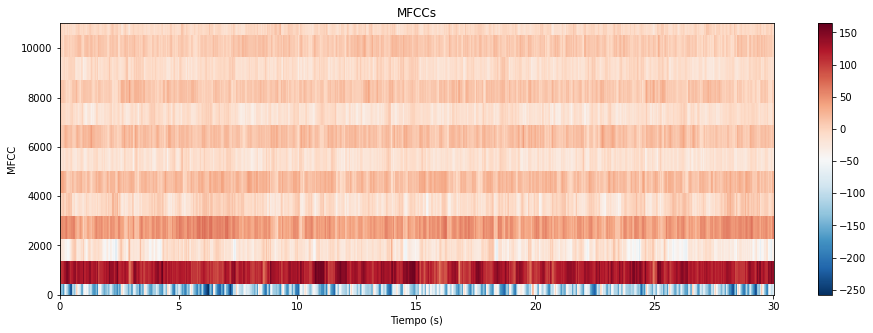

In [ ]:
# MFCC, para obtener los ceptrums que servirán de entrada a los modelos
# Se fija el número de coeficientes a 13 (número habitual en el análisis musical) [Logan, Beth. (2000)]
MFCCs = librosa.feature.mfcc(audio_data_blues, sr=sr,n_mfcc=13, n_fft=n_fft, hop_length=hop_length)

# Las franjas son los coeficientes a lo largo del tiempo
plt.figure(figsize=(16, 5))
librosa.display.specshow(MFCCs, sr=sr, hop_length=hop_length, x_axis="time", y_axis="hz", cmap="RdBu_r")
plt.title("MFCCs")
plt.xlabel("Tiempo (s)")
plt.ylabel("MFCC")
plt.colorbar()
plt.show()

# Generación de los conjuntos de Train, Validation y Test





## Función para generar los subdirectorios de  Train, Validación y Test
 
Dado que las muestras  se dividen en segmentos, será más conveniente si los segmentos de una misma pista de audio se incluyen todos en el mismo conjunto, por lo que antes de extraer las características se copiaran los ficheros de forma aleartoria según una distribución dada (**80% train, 10% validación y otro 10% para test**) y se crearán los subdirectorios `train, val y test`  en para alojarlos en la unidad de persistencia compartida `drive/Shareddrives/UCM SHARED/GTZAN_Colab`.
 
Para ello se usará la libreria `split-folders` [8].

In [ ]:
# ratio puede ser tupla de 2: (train, test), o de 3 (train, validation, test)
splitfolders.ratio(DATASET_PATH, SPLIT_SETS_PATH, seed=123, ratio=(.8, .1, .1), group_prefix=None) 

In [11]:
# Comprobación del numero de muestras wav correcto
check_directories(SPLIT_SETS_PATH)

Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/blues, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/classical, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/country, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/hiphop, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/disco, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/metal, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/jazz, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/pop, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/reggae, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/rock, Número de ficheros wav: 480
Direct

# Pre-procesado y carga de datos 
Se realizará *Data Augmentation* en audio de las muestras wav **sobre las muestras de train para expandir el dataset**. Posteriormente se extraerán los MFCCs de forma masiva de todas las canciones reagrupadas en los subdirectorios de train, validation y test y se generarán los respectivos datasets con las características extraídas que servirán de entrada a los distintos modelos. 

También y para tener una fuente alternativa de datos se generarán los espectrogramas de todas las muestras wav para cada subdirectorio, se convertirán en imágenes PNG y se aplicará *Data Augmentation* en imágenes en el directorio de train.



## Audio Data Augmentation
Como el dataset es muy limitado dada la complejidad de la clasificación, el numero de muestras (1000) y el número de clases (10), se van a aplicar una serie de transformaciones para obtener más datos.

Esto también hará que la red sea mas robusta ante perturbaciones o ruidos.

Para la generación de datos aumentados de audio se usará la librería `audiomentations` [9].

In [ ]:
# Fichero de ejemplo para ver las transformaciones
audio_data = audio_data_classical
audio_data.shape

(661794,)

### Pitch Shifting

Se cambia el tono sin afectar a la velocidad/duracion.


In [ ]:
augment = Compose([
    PitchShift(min_semitones=-4, max_semitones=4, p=1.0)
])

# Transformar entrada
audio_data_augmented = augment(samples=audio_data, sample_rate=sr)
IPython.display.Audio(audio_data_augmented,rate=sr)

### Time Stretching
Dilatación del tiempo: mediante un factor entre [0.7, 1.25] se cambia la velocidad y por tanto la duración de las pistas. 

Por simplificar, se utilizará la opción `leave_length_unchanged=True`

In [ ]:
augment = Compose([
    TimeStretch(min_rate=0.7, max_rate=1.25, p=1.0)
])

# Transformar entrada
audio_data_augmented = augment(samples=audio_data, sample_rate=sr)
IPython.display.Audio(audio_data_augmented,rate=sr)

### Añadir ruido de fondo
Se añadirá ruido Gaussiano a las muestras.

In [ ]:
augment = Compose([
    AddGaussianNoise(p=0.5),
])

# Transformar entrada
audio_data_augmented = augment(samples=audio_data, sample_rate=sr)
IPython.display.Audio(audio_data_augmented,rate=sr)

### Función para generar los datos aumentados 
Generará datos aumentados a partir de los ficheros wav de un directorio. Se aplicarán las 3 transformaciones de forma secuencial. 

Los nuevos ficheros se copiarán al mismo directorio que el de origen (directorios de particiones `train/val/test`).

In [ ]:
# Generará una tanda de datos aumentados aplicando cada una de las 3 transformaciones 
# sobre cada fichero con una probabilidad del 0.5
def audio_data_augmentation(train_wav_path, prefix="augmented."):
  '''
    train_wav_path: ruta del directorio del conjunto de muestras wav de entrenamiento
    prefix: prefijo para los nombres de los ficheros aumentados
  '''
  # Definimos las transformaciones a aplicar 
  augment = Compose([
      TimeStretch(min_rate=0.8, max_rate=1.25, p=0.5, leave_length_unchanged=True),
      AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=0.5),
      PitchShift(min_semitones=-4, max_semitones=4, p=0.5)
  ])

  # Iterar en las carpetas de generos 
  #   dirpath: directorio actual
  #   dirnames: subdirectorios en dirpath
  #   filenames: todos los ficheros en dirpath (ruta relativa)
  for _, (dirpath, dirnames, filenames) in enumerate(os.walk(train_wav_path)):
    if len(filenames) > 0:
      # Guardamos etiqueta de genero obtenida del subdirectorio actual (clases)
      print("\nProcesando directorio: {}".format(dirpath))

      # Procesamos los ficheros del subdirectorio actual (genre)
      print("\tdirnames: {}".format(dirnames))
      print("\tfilenames: {}\n".format(filenames))

      #Filtramos los ficheros aumentados de otras posibles tandas
      filenames = [x for x in filenames if "augmented_" not in x]

      for f in filenames:
        # Obtenemos la ruta absoluta del fichero
        file_path = os.path.join(dirpath, f)

        # Cargamos un archivo de audio wav como una serie temporal(default sr=22050).
        audio_data, sr = librosa.load(file_path)

        # Aplicamos transformaciones   
        audio_data_augmented = augment(samples=audio_data, sample_rate=sr)

        # Directorio de de salida respetando división previa en train y t
        wav_filename = prefix + f
        # print("wav_filename: " + wav_filename)

        out_filename = os.path.join(dirpath, wav_filename)
        sf.write(out_filename, audio_data_augmented, sr, subtype='PCM_24')

In [ ]:
# Generamos 5 tandas de datos augmentados
for i in range(1,6):
  idx = "{0:0=2d}".format(i)
  prefix = "augmented_" + idx + "."
  audio_data_augmentation(SPLIT_SETS_PATH + "/train/", prefix)

In [ ]:
# Comprobación del numero de muestras train aumentadas
check_directories(SPLIT_SETS_PATH)

Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/blues, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/classical, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/country, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/hiphop, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/disco, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/metal, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/jazz, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/pop, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/reggae, Número de ficheros wav: 480
Directorio: drive/Shareddrives/UCM SHARED/GTZAN_Colab/wav/train/rock, Número de ficheros wav: 480
Direct

## Función para extraer las mfccs de los subdirectorios 

In [ ]:
# Pre-procesado de datos
def save_mfcc(dataset_path, json_path, json_filename, track_length, use_augmented_audio_data=False, sr=22050, num_segments=1, num_mfcc=13, n_fft=2048, hop_length=512, verbose=False):
  '''
    dataset_path: ruta del directorio del dataset donde estaran las pistas wav
    json_path: ruta del directorio donde se guardará el fichero json con los MFCCs extraidos
    json_filename: nombre para el fichero json con los MFCCs
    track_length: duración en segundos de cada muestra wav
    use_augmented_audio_data= indica si se deben usar los datos de audio aumentados del directorio (False por defecto)
    sr: sample rate de las muestras wav de entrada
    n_mfcc: numero de coeficientes del MFCC
    n_fft: ventana STFT (# de muestras)
    hop_length: desplazamiento de la ventana STFT (# de muestras hacia adelante)
    num_segments: para dividir cada fuichero wav en num_segments segmentos
  '''
  # Diccionario donde se iran guardando las rutas, MFCCs y etiquetas de los ficheros de muestra
  # Se volcara al final en el json
  # Hay correspondencia entre genres -> class_labels
  data = {
    "genres": [],
    "mfccs": [],
    "class_labels": []
  }

  # Variables para controlar procesado de ficheros por segmentos
  num_samples_by_file = sr * track_length  # 22050 * 30 = 661500 samples/fichero wav
  num_samples_by_segment = int(num_samples_by_file / num_segments)  # 661500 / 10 = 66150 samples/segmento
  # Vienen dados por el desplazamiento STFT
  num_mfcc_vectors_by_segment = math.ceil(num_samples_by_segment / hop_length)  # ceil(66150 / 512) = 130

  # Num errores: para informar de cuantos segmentos no se han procesado
  num_errors = 0
  bad_segments = []

  # Si se usan datos aumentados de audio cambiamos nombre de fichero de salida a augmented_...
  if use_augmented_audio_data:
    json_filename = "augmented_" + json_filename

  print("num_samples_by_file: {}".format(num_samples_by_file))
  print("num_samples_by_segment: {}".format(num_samples_by_segment))
  print("num_mfcc_vectors_by_segment: {}".format(num_mfcc_vectors_by_segment))

  # Iterar en las carpetas de generos 
  #   i: # iteracion actual
  #   dirpath: directorio actual
  #   dirnames: subdirectorios en dirpath
  #   filenames: todos los ficheros en dirpath (ruta relativa)
  for i, (dirpath, dirnames, filenames) in enumerate(os.walk(dataset_path)):
    if dirpath is not dataset_path:
      # Guardamos etiqueta de genero obtenida del subdirectorio actual (clases)
      dirpath_components = dirpath.split("/") # Gitzen/blues/ => ["Gitzen","blues"]
      genre_label = dirpath_components[-1]    # "blues"
      data["genres"].append(genre_label)
      print("\nProcesando directorio: {} ({})".format(genre_label, dirpath))

      # Procesamos los ficheros del subdirectorio actual (genre)
      print("\tdirnames: {}".format(dirnames))
      print("\tfilenames: {}\n".format(filenames))

      # Si no se usaran datos de audio aumentados se filtran 
      if not use_augmented_audio_data:
        filenames = [x for x in filenames if "augmented_" not in x]
      
      json_file_path = os.path.join(json_path, json_filename)
      
      for f in filenames:
        # Obtenemos la ruta absoluta del fichero
        file_path = os.path.join(dirpath, f)

        # Cargamos un archivo de audio wav como una serie temporal(default sr=22050).
        audio_data, sr = librosa.load(file_path, sr=sr)
        # Eliminar silencios del inicio y del final
        #audio_data, _ = librosa.effects.trim(audio_data)
      
        # Procesamos todos los segmentos del fichero 
        for s in range(num_segments):
          first_segment_sample = num_samples_by_segment * s
          last_segment_sample = first_segment_sample + num_samples_by_segment
          # Obtenemos MFCC por segmento
          mfcc = librosa.feature.mfcc(audio_data[first_segment_sample:last_segment_sample], sr=sr, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
          mfcc = mfcc.T

          # Guardamos MFCC si su longitud es correcta (deben ser todas de la misma dimension)
          if len(mfcc) == num_mfcc_vectors_by_segment:
            data["mfccs"].append(mfcc.tolist())
            # Primera iteracion es dataset_path, se resta 1 para que empiece en 0
            # class_labels viene del indice del subdirectorio correspondiente al genero 
            data["class_labels"].append(i-1)
            if verbose:   
              print("\tFichero: {}, segmento: {}".format(file_path, s+1)) # s+1 para empezar en 1
          else:
            num_errors += 1
            bad_segments.append((file_path, s+1, data["mfccs"]))
          
  # Guarda MFCC en fichero json
  if not os.path.isdir(json_path): 
    os.makedirs(json_path)

  with open(json_file_path, "w") as fp:
    json.dump(data, fp, indent=4)

  # Informa de errores y los ficheros y segmentos no procesados si ha habido
  print("\nNumero de sectores no procesados: {}".format(num_errors))
  if num_errors > 0: 
    for e in bad_segments:
      print("\tFichero: {}, segmento: {}, shape: {}".format(e[0], e[1], len(e[2]))) 

**10 segmentos:** Cada muestra se divide en 10 segmentos de 3 segundos cada uno.

Generaremos **2 ficheros para cada partición train/val/test: uno sin los datos de audio aumentados y el otro con ellos**

In [ ]:
# SIN AUDIO DATA AUGMENTATION
save_mfcc(SPLIT_SETS_PATH + "/train", JSON_PATH + "/train", "train_" + JSON_FILENAME, use_augmented_audio_data=False, track_length=30, num_segments=10)

In [ ]:
# CON AUDIO DATA AUGMENTATION
save_mfcc(SPLIT_SETS_PATH + "/train", JSON_PATH + "/train", "train_" + JSON_FILENAME, use_augmented_audio_data=True, track_length=30, num_segments=10)

In [ ]:
# Para los ficheros de validacion y test no hay datos aumentados
save_mfcc(SPLIT_SETS_PATH + "/val", JSON_PATH + "/val", "val_" + JSON_FILENAME, track_length=30, num_segments=10)

In [ ]:
save_mfcc(SPLIT_SETS_PATH + "/test", JSON_PATH + "/test", "test_" + JSON_FILENAME, track_length=30, num_segments=10)

## Carga del fichero de características MFCCs desde el json

In [15]:
# Funcion para cargar el json generado con los MFCCs
def load_data(dataset_path):
  '''
    dataset_path: ruta del directorio del dataset
  '''
  with open(dataset_path, "r") as fp:
    data = json.load(fp)

  genres = np.array(data["genres"])
  mfccs = np.array(data["mfccs"])
  # Generamos las etiquetas de las clases como enteros (indices de los generos)  
  class_int_labels = np.array(data["class_labels"])
  # Generamos las etiquetas de las clases en string (generos)
  class_str_labels = np.array([genres[x] for x in class_int_labels])

  return genres, mfccs, class_int_labels, class_str_labels

In [16]:
# SIN AUDIO DATA AUGMENTATION
# Cargamos el fichero g de train generado en nuestra sesion de Colab
genres_train, X_train, y_train, y_train_str = load_data(JSON_PATH + "/train/train_" + JSON_FILENAME)

# Cargamos el fichero g de val generado en nuestra sesion de Colab
genres_val, X_val, y_val, y_val_str = load_data(JSON_PATH + "/val/val_" + JSON_FILENAME)

# Cargamos el fichero g de test generado en nuestra sesion de Colab
genres_test, X_test, y_test, y_test_str = load_data(JSON_PATH + "/test/test_" + JSON_FILENAME)

In [ ]:
# num_samples = 10000
# num_samples_by_file: 661500
# num_samples_by_segment: 220500
# num_mfcc_vectors_by_segment: 130  #Son como time bins
# num_mfcc_coefficients: 13
X_train.shape

(7996, 130, 13)

In [ ]:
X_val.shape

(1000, 130, 13)

In [ ]:
X_test.shape

(1000, 130, 13)

In [ ]:
# Comprobamos frecuencias:
pd.DataFrame(y_train_str).value_counts()

rock         800
reggae       800
pop          800
metal        800
jazz         800
blues        800
hiphop       799
disco        799
country      799
classical    799
dtype: int64

In [ ]:
pd.DataFrame(y_val_str).value_counts()

rock         100
reggae       100
pop          100
metal        100
jazz         100
hiphop       100
disco        100
country      100
classical    100
blues        100
dtype: int64

In [ ]:
pd.DataFrame(y_test_str).value_counts()

rock         100
reggae       100
pop          100
metal        100
jazz         100
hiphop       100
disco        100
country      100
classical    100
blues        100
dtype: int64

In [ ]:
# CON AUDIO DATA AUGMENTATION
# Cargamos el fichero MFCCs de train generado en nuestra sesion de Colab
genres_augmented_train, X_augmented_train, y_augmented_train, y_augmented_train_str = load_data(JSON_PATH + "/train/augmented_train_" + JSON_FILENAME)

In [ ]:
X_augmented_train.shape

(47976, 130, 13)

In [ ]:
# Comprobamos frecuencias:
pd.DataFrame(y_augmented_train_str).value_counts()

rock         4800
reggae       4800
pop          4800
metal        4800
jazz         4800
blues        4800
hiphop       4794
disco        4794
country      4794
classical    4794
dtype: int64

## Función para generar los espectrogramas como imagenes PNG

In [ ]:
# Pre-procesado de datos
def save_png_spectrograms(dataset_path, png_path=None, use_augmented_audio_data=False, sr=22050, n_fft=2048, hop_length=512):
  '''
    dataset_path: ruta del directorio del dataset
    png_path: ruta del directorio de salida
    n_mfcc: numero de coeficientes del MFCC
    n_fft: ventana STFT (# de muestras)
    hop_length: desplazamiento de la ventana STFT (# de muestras hacia adelante)
  '''
  # Diccionario donde se iran guardando las rutas, MFCCs y etiquetas de los ficheros de muestra
  # Se volcara al final en el json
  # Hay correspondencia entre genres -> class_labels
  data = {
    "genres": [],
    "filepath": [],
    "class_labels": []
  }
 
  # Iterar en las carpetas de generos 
  #   i: # iteracion actual
  #   dirpath: directorio actual
  #   dirnames: subdirectorios en dirpath
  #   filenames: todos los ficheros en dirpath (ruta relativa)
  for i, (dirpath, dirnames, filenames) in enumerate(os.walk(dataset_path)):
    #if dirpath is not dataset_path:
    if len(filenames) > 0:
      # Guardamos etiqueta de genero obtenida del subdirectorio actual (clases)
      dirpath_components = dirpath.split("/") # Gitzen/blues/ => ["Gitzen","blues"]
      genre_label = dirpath_components[-1]    # "blues"
      data["genres"].append(genre_label)
      print("\nProcesando directorio: {} ({})".format(genre_label, dirpath))
 
      # Si no se usaran datos de audio aumentados se filtran 
      if not use_augmented_audio_data:
        filenames = [x for x in filenames if "augmented_" not in x]
 
      # Procesamos los ficheros del subdirectorio actual (genre)
      print("\tdirnames: {}".format(dirnames))
      print("\tfilenames: {}\n".format(filenames))
      
      for f in filenames:
        # Obtenemos la ruta absoluta del fichero
        file_path = os.path.join(dirpath, f)
 
        # Si no se especifica ruta destino se crearán los mismos directorios origen centrados en /png/
        if png_path == None:
          png_filepath = dirpath.replace("wav", "png")
          
          if use_augmented_audio_data:
            png_filepath = png_filepath.replace("/train/", "/train/augmented_data/", 1)            
          else:
            png_filepath = png_filepath.replace("/train/", "/train/initial_data/", 1)
        else:
          png_filepath = png_path.rstrip("/") + "/" + genre_label
        png_filename = f.replace("wav", "png")
 
        # Cargamos un archivo de audio wav como una serie temporal(default sr=22050).
        audio_data, sr = librosa.load(file_path, sr=sr)
        # Eliminar silencios del inicio y del final
        audio_data, _ = librosa.effects.trim(audio_data)
 
        # Generamos espectrograma
        window = np.hanning(n_fft)
        stft  = librosa.core.spectrum.stft(audio_data, n_fft=n_fft, hop_length=hop_length, window=window)
        out = 2 * np.abs(stft) / np.sum(window)
 
        fig = plt.Figure()
        canvas = FigureCanvas(fig)
        ax = fig.add_subplot(111)
        p = librosa.display.specshow(librosa.amplitude_to_db(out, ref=np.max), ax=ax, y_axis='log', x_axis='time');
 
        # Quitamos etiquetas, marcas y valores de los ejes
        ax.set_ylabel('')
        ax.set_xlabel('')
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.set_yticks([])
        ax.set_xticks([])
        ax.set_xticks([])
        ax.tick_params(axis='both', which='both', length=0)
 
        # Directorio de de salida respetando división previa en train val y test
        if not os.path.isdir(png_filepath): 
          os.makedirs(png_filepath)
 
        filename = os.path.join(png_filepath, png_filename)
        #print(filename)
        fig.savefig(filename)

Le pasamos la ruta de las copias en la unidad compartida de persistencia `GTZAN_Colab` para que genere las imagenes PNG con las mismas estructuras de directorios que las que ha creado para las muestras audio wav en `train/val/test`.

In [ ]:
# Generamos los PNGs en .../png/train/initial_data/ SOLO con las muestras iniciales de entrenamiento
save_png_spectrograms(SPLIT_SETS_PATH)

In [ ]:
# Generamos los PNGs en .../png/train/augmented_data/ con las muestras iniciales y aumentadas de entrenamiento
save_png_spectrograms(SPLIT_SETS_PATH, use_augmented_audio_data=True)

drive/Shareddrives/UCM SHARED/GTZAN_Colab/png/train/initial_data/blues/blues.00003.png


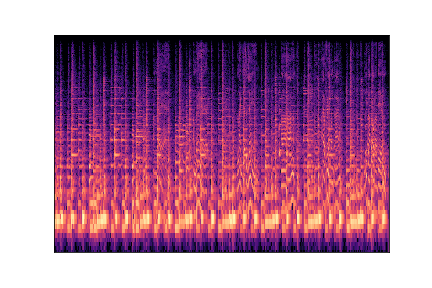

Alto,Ancho,#Canales(RGB): (288, 432, 3)

drive/Shareddrives/UCM SHARED/GTZAN_Colab/png/train/initial_data/blues/blues.00005.png


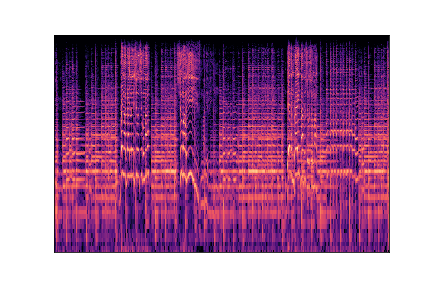

Alto,Ancho,#Canales(RGB): (288, 432, 3)

drive/Shareddrives/UCM SHARED/GTZAN_Colab/png/train/initial_data/blues/blues.00002.png


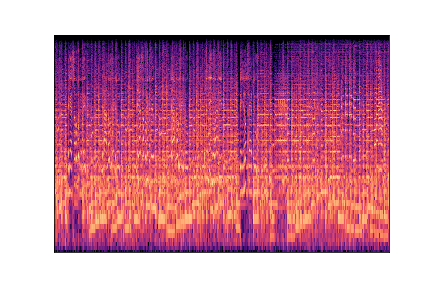

Alto,Ancho,#Canales(RGB): (288, 432, 3)



In [ ]:
# Chequeo imagenes generadas, son de dimension 288 x 432px, al ser todas iguales se ha mantenido resolución original
ficheros = glob.glob(PNG_PATH + "/train/initial_data/blues/blues*.png")
for f in ficheros[:3]:
  print(f)
  imagen = load_img(f)
  display(imagen)
  print("Alto,Ancho,#Canales(RGB): "+format(np.array(imagen).shape))
  PNG_SHAPE = np.array(imagen).shape
  print()

## Data Augmentation en imágenes y carga de los datasets de imagenes
Para la generación de datos aumentados de imagenes PNG usaremos la propia clase `ImageDataGenerator` de Keras como ya se vió en clase.

Solo se aplicará Data Augmentation sobre el conjunto de train pero se definen los *ImageDataGenerator* para los otros conjuntos sin realizar transformaciones sobre las imágenes a excepción de su normalizado.

In [ ]:
preprocess_input = lambda x:x/255.

train_datagen = ImageDataGenerator(
  dtype='float32',
  preprocessing_function = preprocess_input,  # all our pixel values are in range (0,1)
  shear_range=0.2,                            #to apply some random tranfromations
  zoom_range=0.2,                             #to apply zoom
  horizontal_flip=True   # image will be flipper horiztest_datagen = ImageDataGenerator(rescale=1./255)
)

val_datagen = ImageDataGenerator(
  dtype='float32',
  preprocessing_function = preprocess_input
)

test_datagen = ImageDataGenerator(
  dtype='float32',
  preprocessing_function = preprocess_input
)

# Construcción de modelos

In [ ]:
# Funcion para plotear las metricas y el error
def plot_history(history):
    """
      history: modelo entrenado (model.fit)
    """

    # Queremos 2 plots: para las metricas y otro para train
    fig, axs = plt.subplots(2, figsize=(16, 5))

    # Metricas
    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="test accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval")

    # create error sublpot
    axs[1].plot(history.history["loss"], label="train error")
    axs[1].plot(history.history["val_loss"], label="test error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval")

    plt.show()

In [ ]:
# Resultados train/val/test
def show_scores(X_train, y_train, X_val, y_val, X_test, y_test):
  scores_tr = model.evaluate(X_train, y_train, verbose=2)
  print('Train loss    :', scores_tr[0])
  print('Train accuracy:', scores_tr[1])
  print()

  scores_val = model.evaluate(X_val, y_val, verbose=2)
  print('Val loss    :', scores_val[0])
  print('Val accuracy:', scores_val[1])
  print()

  scores_te = model.evaluate(X_test, y_test, verbose=2)
  print('Test loss     :', scores_te[0])
  print('Test accuracy :', scores_te[1])

In [ ]:
def plot_auc(y_test, y_pred_proba, genres_list, title):
  '''
    y_test: etiquetas reales
    y_pred_proba: predicciones
  '''
  colors = ["green", "red", "cyan", "magenta", "yellow", "black", "grey", "brown", "orange", "purple"]
  classes = {v: k for v, k in enumerate(genres_test)}

  fig, ax1 = plt.subplots(1,figsize=(10, 5))
   
  for c in classes:
    clase_positiva = c
    fpr, tpr, thresholds = roc_curve(y_test==clase_positiva, y_pred_proba[:,clase_positiva])
    
    ax1.plot(fpr, tpr, 'r-.', label = classes[c]+'(%2.2f)' % auc(fpr, tpr), color=colors[c])

  ax1.set_xlabel('False Positive Rate')
  ax1.set_ylabel('True Positive Rate')
  ax1.plot(fpr, fpr, 'b-', label = 'Random Guess')
  ax1.set_title(title)
  ax1.legend();

## Clasificacion con MLP

### Modelo base MLP
Se generará un modelo base de referencia solo con capas densas que posteriormente se optimizará con el uso de regularización L2 y Dropout. Después se generarán otros modelos CNN y LSTM y se compararán con el modelo base.


#### Sin Audio Data Augmentation

In [17]:
# Definimos forma de la entrada
input_shape=(X_train.shape[1], X_train.shape[2])

In [18]:
# Definimos arquitectura de la red
model = Sequential()
model.add(Flatten(input_shape=input_shape))
model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(10, activation='softmax'))
 
# Definimos optimizador
optimizer = Adam(learning_rate=0.001)
 
# Compilamos modelo
model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])
 
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 1690)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               865792    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_4 (Dense)              (None, 10)                650       
Total params: 1,038,922
Trainable params: 1,038,922
Non-trainable params: 0
____________________________________________

In [ ]:
# Entrenamos el modelo
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=60, batch_size=32, shuffle=True)

Epoch 1/60
250/250 [==============================] - 3s 10ms/step - loss: 15.7980 - accuracy: 0.2839 - val_loss: 2.7283 - val_accuracy: 0.3830
Epoch 2/60
250/250 [==============================] - 2s 10ms/step - loss: 1.5824 - accuracy: 0.4653 - val_loss: 2.4945 - val_accuracy: 0.4060
Epoch 3/60
250/250 [==============================] - 2s 10ms/step - loss: 1.3544 - accuracy: 0.5191 - val_loss: 2.7967 - val_accuracy: 0.4300
Epoch 4/60
250/250 [==============================] - 2s 10ms/step - loss: 1.2052 - accuracy: 0.5714 - val_loss: 2.6919 - val_accuracy: 0.5230
Epoch 5/60
250/250 [==============================] - 2s 10ms/step - loss: 1.0991 - accuracy: 0.6125 - val_loss: 3.0587 - val_accuracy: 0.4820
Epoch 6/60
250/250 [==============================] - 2s 10ms/step - loss: 0.9983 - accuracy: 0.6492 - val_loss: 3.8784 - val_accuracy: 0.5000
Epoch 7/60
250/250 [==============================] - 2s 10ms/step - loss: 0.9512 - accuracy: 0.6552 - val_loss: 3.9305 - val_accuracy: 0.514

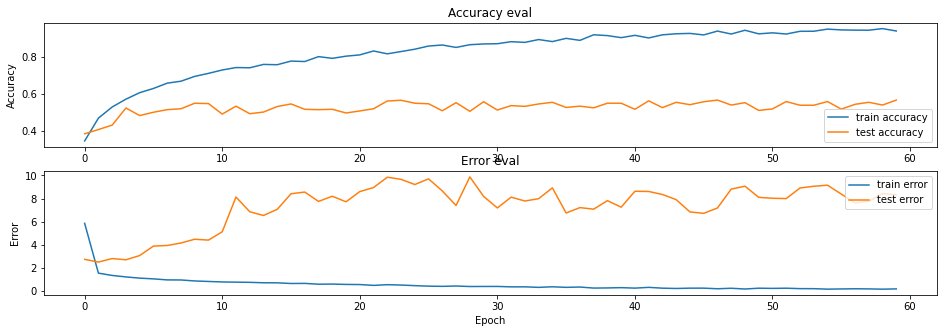

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_train, y_train, X_val, y_val, X_test, y_test)

250/250 - 1s - loss: 0.1292 - accuracy: 0.9570
Train loss    : 0.12923067808151245
Train accuracy: 0.9569784998893738

32/32 - 0s - loss: 8.3125 - accuracy: 0.5660
Val loss    : 8.312488555908203
Val accuracy: 0.5659999847412109

32/32 - 0s - loss: 3.3226 - accuracy: 0.5440
Test loss     : 3.322622060775757
Test accuracy : 0.5440000295639038


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.75      0.43      0.55       100
   classical       0.78      0.77      0.77       100
     country       0.47      0.55      0.51       100
      hiphop       0.39      0.48      0.43       100
       disco       0.39      0.38      0.38       100
       metal       0.68      0.71      0.69       100
        jazz       0.62      0.56      0.59       100
         pop       0.80      0.78      0.79       100
      reggae       0.47      0.55      0.51       100
        rock       0.24      0.23      0.23       100

    accuracy                           0.54      1000
   macro avg       0.56      0.54      0.55      1000
weighted avg       0.56      0.54      0.55      1000



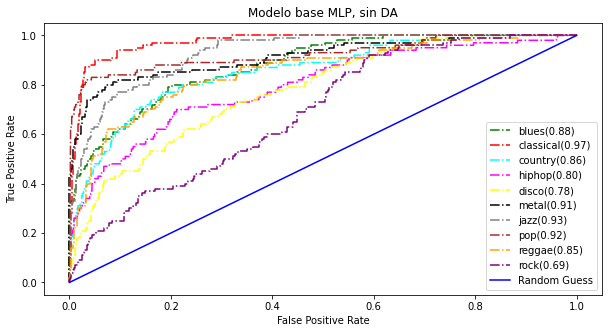

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo base MLP, sin DA")

#### Con Audio Data Augmentation

In [ ]:
# CON AUDIO DATA AUGMENTATION
# Cargamos el fichero MFCCs de train generado en nuestra sesion de Colab
genres_augmented_train, X_augmented_train, y_augmented_train, y_augmented_train_str = load_data(JSON_PATH + "/train/augmented_train_" + JSON_FILENAME)

In [ ]:
# Definimos forma de la entrada
input_shape=(X_augmented_train.shape[1], X_augmented_train.shape[2])

In [19]:
# Compilamos modelo
model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])
 
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 1690)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               865792    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_4 (Dense)              (None, 10)                650       
Total params: 1,038,922
Trainable params: 1,038,922
Non-trainable params: 0
____________________________________________

In [ ]:
# Entrenamos el modelo
history = model.fit(X_augmented_train, y_augmented_train, validation_data=(X_val, y_val), epochs=60, batch_size=32, shuffle=True)

Epoch 1/60
1500/1500 [==============================] - 14s 9ms/step - loss: 4.7841 - accuracy: 0.2611 - val_loss: 2.6863 - val_accuracy: 0.4400
Epoch 2/60
1500/1500 [==============================] - 14s 9ms/step - loss: 1.6608 - accuracy: 0.4104 - val_loss: 3.4244 - val_accuracy: 0.4760
Epoch 3/60
1500/1500 [==============================] - 14s 9ms/step - loss: 1.4561 - accuracy: 0.4832 - val_loss: 4.3808 - val_accuracy: 0.4540
Epoch 4/60
1500/1500 [==============================] - 14s 9ms/step - loss: 1.3408 - accuracy: 0.5279 - val_loss: 3.4909 - val_accuracy: 0.5050
Epoch 5/60
1500/1500 [==============================] - 14s 9ms/step - loss: 1.2202 - accuracy: 0.5687 - val_loss: 4.2440 - val_accuracy: 0.5320
Epoch 6/60
1500/1500 [==============================] - 14s 9ms/step - loss: 1.1661 - accuracy: 0.5876 - val_loss: 4.5550 - val_accuracy: 0.4780
Epoch 7/60
1500/1500 [==============================] - 14s 9ms/step - loss: 1.0725 - accuracy: 0.6250 - val_loss: 3.9951 - val_ac

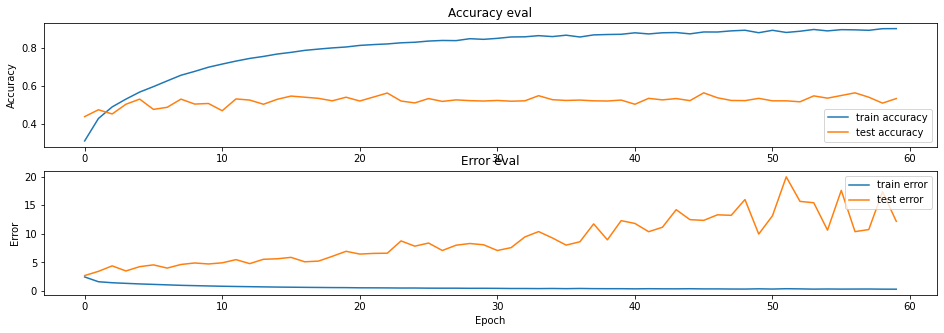

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_augmented_train, y_augmented_train, X_val, y_val, X_test, y_test)

1500/1500 - 4s - loss: 0.2456 - accuracy: 0.9203
Train loss    : 0.24557964503765106
Train accuracy: 0.9202934503555298

32/32 - 0s - loss: 12.1683 - accuracy: 0.5350
Val loss    : 12.168320655822754
Val accuracy: 0.5350000262260437

32/32 - 0s - loss: 4.2735 - accuracy: 0.5500
Test loss     : 4.27345085144043
Test accuracy : 0.550000011920929


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.62      0.56      0.59       100
   classical       0.86      0.73      0.79       100
     country       0.45      0.58      0.51       100
      hiphop       0.50      0.50      0.50       100
       disco       0.37      0.49      0.42       100
       metal       0.74      0.71      0.72       100
        jazz       0.61      0.51      0.56       100
         pop       0.68      0.75      0.71       100
      reggae       0.54      0.36      0.43       100
        rock       0.29      0.31      0.30       100

    accuracy                           0.55      1000
   macro avg       0.57      0.55      0.55      1000
weighted avg       0.57      0.55      0.55      1000



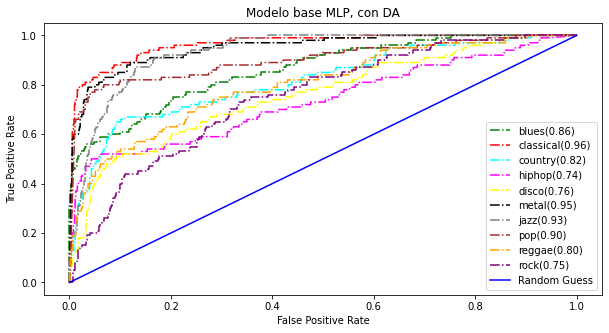

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo base MLP, con DA")

Como podemos ver en los resultados y las gráficas, hay una gran diferencia entre los resultados de Train y Test lo que nos indica que ha habido gran **overfitting**. 

Además el uso de los **datos aumentados** no parece que podría mejorar frente a no usarlos, se podría **entrenar más épocas**.

### Modelo MLP con Dropout y regularizacion L2
Tras jugar con la arquitectura de la red (añadir y quitar capas), con Dropout, Regularizacion L2, probar distintos valores del Learning Rate y el número de épocas a entrenar nos quedamos con este modelo frente al modelo base.






#### Sin Audio Data Augmentation

In [26]:
# Definimos forma de la entrada
input_shape=(X_train.shape[1], X_train.shape[2])

In [28]:
# Definimos la arquitectura de la red
model = Sequential()
model.add(Flatten(input_shape=input_shape))
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.3))
model.add(Dense(64, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.3))
model.add(Dense(10, activation='softmax'))

# Definimos optimizador
optimizer = Adam(learning_rate=0.0001)

# Compilamos modelo
model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_5 (Flatten)          (None, 1690)              0         
_________________________________________________________________
dense_24 (Dense)             (None, 512)               865792    
_________________________________________________________________
dropout_15 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 128)               32896     
_________________________________________________________________
dropout_17 (Dropout)         (None, 128)              

In [ ]:
# Entrenamos el modelo
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=120, batch_size=32, shuffle=True)

Epoch 1/120
250/250 [==============================] - 4s 14ms/step - loss: 54.4916 - accuracy: 0.1223 - val_loss: 16.0575 - val_accuracy: 0.2200
Epoch 2/120
250/250 [==============================] - 3s 14ms/step - loss: 19.7434 - accuracy: 0.1489 - val_loss: 15.4963 - val_accuracy: 0.2370
Epoch 3/120
250/250 [==============================] - 3s 13ms/step - loss: 16.4826 - accuracy: 0.1729 - val_loss: 15.1211 - val_accuracy: 0.2320
Epoch 4/120
250/250 [==============================] - 3s 13ms/step - loss: 15.5088 - accuracy: 0.1768 - val_loss: 14.7595 - val_accuracy: 0.2680
Epoch 5/120
250/250 [==============================] - 3s 13ms/step - loss: 14.9465 - accuracy: 0.2011 - val_loss: 14.3815 - val_accuracy: 0.2470
Epoch 6/120
250/250 [==============================] - 3s 13ms/step - loss: 14.4680 - accuracy: 0.2221 - val_loss: 13.9312 - val_accuracy: 0.2810
Epoch 7/120
250/250 [==============================] - 3s 13ms/step - loss: 14.0079 - accuracy: 0.2477 - val_loss: 13.4846 -

Como podemos ver en los resultados y las gráficas, la diferencia entre los resultados de Train y Test se ha reducido, aunque a partir de cierta época el rendimiento se estanca y la diferencia entre ambas se dispara. No obstante, **se ha conseguido reducir algo de sobreajuste**. 

Además, como el modelo es más estable **se ha entrenado durante más épocas** que el modelo base logrando obtener mayor precisión, aunque la **mejora en precisión** es pequeña se puede ver que **para algunos estilos** es más notable.


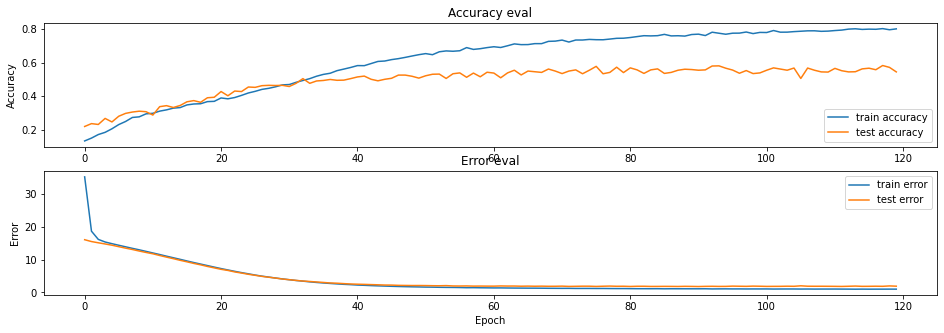

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_train, y_train, X_val, y_val, X_test, y_test)

250/250 - 1s - loss: 0.7118 - accuracy: 0.9125
Train loss    : 0.7118197083473206
Train accuracy: 0.912456214427948

32/32 - 0s - loss: 2.2495 - accuracy: 0.5560
Val loss    : 2.2494759559631348
Val accuracy: 0.5559999942779541

32/32 - 0s - loss: 1.8765 - accuracy: 0.5450
Test loss     : 1.876462697982788
Test accuracy : 0.5450000166893005


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.64      0.50      0.56       100
   classical       0.82      0.63      0.71       100
     country       0.32      0.48      0.38       100
      hiphop       0.47      0.58      0.52       100
       disco       0.52      0.39      0.45       100
       metal       0.78      0.74      0.76       100
        jazz       0.53      0.48      0.51       100
         pop       0.67      0.86      0.75       100
      reggae       0.59      0.49      0.54       100
        rock       0.31      0.30      0.30       100

    accuracy                           0.55      1000
   macro avg       0.56      0.55      0.55      1000
weighted avg       0.56      0.55      0.55      1000



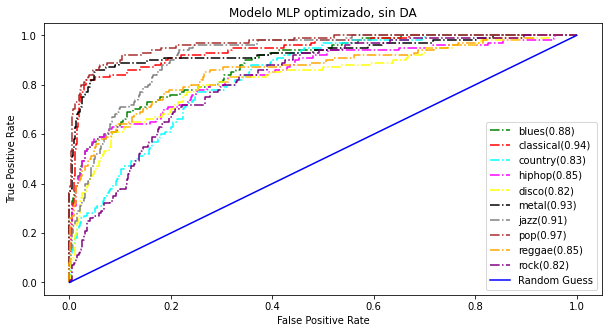

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo MLP optimizado, sin DA")

#### Con Audio Data Augmentation

In [20]:
# CON AUDIO DATA AUGMENTATION
# Cargamos el fichero MFCCs de train generado en nuestra sesion de Colab
genres_augmented_train, X_augmented_train, y_augmented_train, y_augmented_train_str = load_data(JSON_PATH + "/train/augmented_train_" + JSON_FILENAME)

In [24]:
# Definimos forma de la entrada
input_shape=(X_augmented_train.shape[1], X_augmented_train.shape[2])

In [29]:
# Compilamos modelo
model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_5 (Flatten)          (None, 1690)              0         
_________________________________________________________________
dense_24 (Dense)             (None, 512)               865792    
_________________________________________________________________
dropout_15 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 128)               32896     
_________________________________________________________________
dropout_17 (Dropout)         (None, 128)              

In [ ]:
# Entrenamos el modelo
history = model.fit(X_augmented_train, y_augmented_train, validation_data=(X_val, y_val), epochs=120, batch_size=32, shuffle=True)

Epoch 1/120
1500/1500 [==============================] - 20s 13ms/step - loss: 27.7672 - accuracy: 0.1584 - val_loss: 13.6673 - val_accuracy: 0.2800
Epoch 2/120
1500/1500 [==============================] - 19s 13ms/step - loss: 12.6332 - accuracy: 0.2198 - val_loss: 11.1108 - val_accuracy: 0.3240
Epoch 3/120
1500/1500 [==============================] - 19s 12ms/step - loss: 9.8540 - accuracy: 0.2686 - val_loss: 8.3089 - val_accuracy: 0.3390
Epoch 4/120
1500/1500 [==============================] - 19s 12ms/step - loss: 7.1510 - accuracy: 0.2986 - val_loss: 5.8052 - val_accuracy: 0.4280
Epoch 5/120
1500/1500 [==============================] - 18s 12ms/step - loss: 4.9695 - accuracy: 0.3409 - val_loss: 4.1096 - val_accuracy: 0.4240
Epoch 6/120
1500/1500 [==============================] - 18s 12ms/step - loss: 3.5313 - accuracy: 0.3752 - val_loss: 3.1438 - val_accuracy: 0.4390
Epoch 7/120
1500/1500 [==============================] - 18s 12ms/step - loss: 2.6645 - accuracy: 0.4078 - val_los

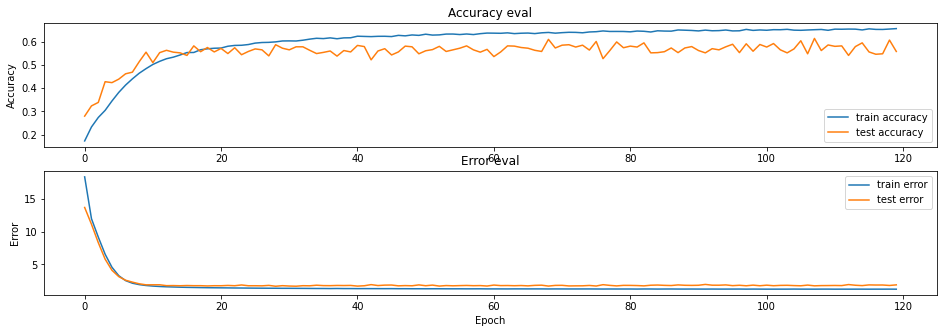

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_augmented_train, y_augmented_train, X_val, y_val, X_test, y_test)

1500/1500 - 6s - loss: 1.0388 - accuracy: 0.7316
Train loss    : 1.0388481616973877
Train accuracy: 0.7315532565116882

32/32 - 0s - loss: 1.8895 - accuracy: 0.5580
Val loss    : 1.889506220817566
Val accuracy: 0.5580000281333923

32/32 - 0s - loss: 1.6798 - accuracy: 0.5510
Test loss     : 1.6798442602157593
Test accuracy : 0.5509999990463257


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.64      0.44      0.52       100
   classical       0.84      0.81      0.82       100
     country       0.47      0.38      0.42       100
      hiphop       0.44      0.68      0.53       100
       disco       0.40      0.47      0.43       100
       metal       0.71      0.71      0.71       100
        jazz       0.62      0.33      0.43       100
         pop       0.66      0.82      0.73       100
      reggae       0.58      0.59      0.59       100
        rock       0.27      0.28      0.28       100

    accuracy                           0.55      1000
   macro avg       0.56      0.55      0.55      1000
weighted avg       0.56      0.55      0.55      1000



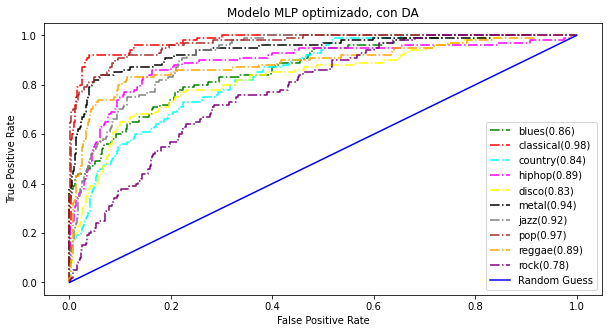

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo MLP optimizado, con DA")

En este caso, parece que ha habido cierta mejora en el overfitting basándose en las gráficas.

## Clasificacion con CNN

Se probarán dos entradas diferentes: los MFCCs como datos en crudo (raw) y imagenes PNG generadas a partir de los espectrogramas.

#### Modelo CNN (MFCCs)

Se probarán **dos entradas diferentes para una red CNN**, la primera opción será con los **MFCCs** que se han usado anteriormente como entrada y la segunda opción utilizará los **espectrogramas como imágenes PNG**, se verá si con este tipo de input la red funciona mejor que con los MFCCs


##### Sin Audio Data Augmentation

In [ ]:
# SIN AUDIO DATA AUGMENTATION
# Cargamos el fichero g de train generado en nuestra sesion de Colab
genres_train, X_train, y_train, y_train_str = load_data(JSON_PATH + "/train/train_" + JSON_FILENAME)

# Cargamos el fichero g de val generado en nuestra sesion de Colab
genres_val, X_val, y_val, y_val_str = load_data(JSON_PATH + "/val/val_" + JSON_FILENAME)

# Cargamos el fichero g de test generado en nuestra sesion de Colab
genres_test, X_test, y_test, y_test_str = load_data(JSON_PATH + "/test/test_" + JSON_FILENAME)

In [30]:
# Expandimos dimension dummy necesaria para las capas convolucionales en Keras
X_train = X_train[..., np.newaxis]
X_val = X_val[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [31]:
# Definimos forma de la entrada
input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
X_train.shape

(7996, 130, 13, 1)

In [32]:
X_val.shape

(1000, 130, 13, 1)

In [33]:
X_test.shape

(1000, 130, 13, 1)

In [34]:
# Definimos arquitectura de la red
model = Sequential()
model.add(Conv2D(32, (3, 3), activation="relu", input_shape=input_shape))
model.add(MaxPooling2D((3,3), strides=(2,2), padding="same"))
model.add(BatchNormalization())

model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D((3,3), strides=(2,2), padding="same"))
model.add(BatchNormalization())

model.add(Conv2D(64, (2,2), activation='relu'))
model.add(GlobalMaxPool2D())
model.add(BatchNormalization())

model.add(Dense(64, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax'))

# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
#              optimizer = Adam(learning_rate=0.0001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 11, 32)       320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 6, 32)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 64, 6, 32)         128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 62, 4, 32)         9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 31, 2, 32)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 31, 2, 32)         128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 1, 64)        

In [ ]:
# Entrenamos el modelo
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=120, batch_size=32, shuffle=True)

Epoch 1/120
250/250 [==============================] - 15s 55ms/step - loss: 2.3539 - accuracy: 0.2032 - val_loss: 1.8733 - val_accuracy: 0.3830
Epoch 2/120
250/250 [==============================] - 14s 54ms/step - loss: 1.6765 - accuracy: 0.4324 - val_loss: 1.5239 - val_accuracy: 0.4910
Epoch 3/120
250/250 [==============================] - 13s 54ms/step - loss: 1.4921 - accuracy: 0.5079 - val_loss: 1.4077 - val_accuracy: 0.5240
Epoch 4/120
250/250 [==============================] - 13s 53ms/step - loss: 1.3827 - accuracy: 0.5444 - val_loss: 1.3528 - val_accuracy: 0.5690
Epoch 5/120
250/250 [==============================] - 13s 53ms/step - loss: 1.2707 - accuracy: 0.5773 - val_loss: 1.2879 - val_accuracy: 0.5850
Epoch 6/120
250/250 [==============================] - 13s 53ms/step - loss: 1.2079 - accuracy: 0.6058 - val_loss: 1.2414 - val_accuracy: 0.5980
Epoch 7/120
250/250 [==============================] - 13s 53ms/step - loss: 1.1534 - accuracy: 0.6036 - val_loss: 1.2114 - val_ac

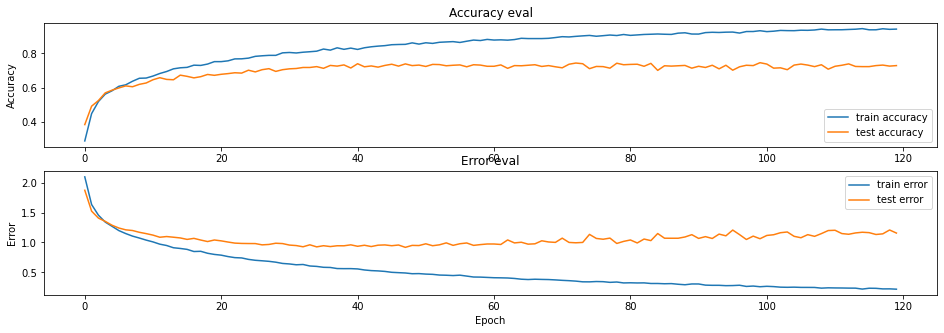

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_train, y_train, X_val, y_val, X_test, y_test)

250/250 - 3s - loss: 0.1126 - accuracy: 0.9895
Train loss    : 0.1126345694065094
Train accuracy: 0.9894947409629822

32/32 - 0s - loss: 1.5308 - accuracy: 0.6890
Val loss    : 1.5307745933532715
Val accuracy: 0.6890000104904175

32/32 - 0s - loss: 1.1573 - accuracy: 0.7290
Test loss     : 1.1572867631912231
Test accuracy : 0.7289999723434448


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.72      0.69      0.70       100
   classical       0.91      0.93      0.92       100
     country       0.63      0.79      0.70       100
      hiphop       0.63      0.65      0.64       100
       disco       0.75      0.60      0.67       100
       metal       0.91      0.83      0.87       100
        jazz       0.82      0.93      0.87       100
         pop       0.74      0.84      0.79       100
      reggae       0.70      0.75      0.72       100
        rock       0.41      0.28      0.33       100

    accuracy                           0.73      1000
   macro avg       0.72      0.73      0.72      1000
weighted avg       0.72      0.73      0.72      1000



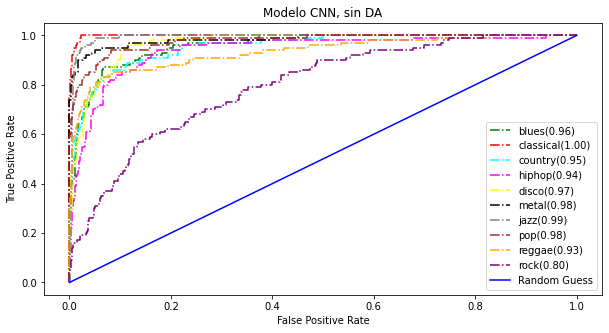

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo CNN, sin DA")

##### Con Audio Data Augmentation

In [ ]:
# CON AUDIO DATA AUGMENTATION
# Cargamos el fichero MFCCs de train generado en nuestra sesion de Colab
genres_augmented_train, X_augmented_train, y_augmented_train, y_augmented_train_str = load_data(JSON_PATH + "/train/augmented_train_" + JSON_FILENAME)

In [ ]:
# Expandimos dimension dummy necesaria para las capas convolucionales en Keras
X_augmented_train = X_augmented_train[..., np.newaxis]

# Definimos forma de la entrada
input_shape = (X_augmented_train.shape[1], X_augmented_train.shape[2], X_augmented_train.shape[3])
X_augmented_train.shape

(47976, 130, 13, 1)

In [ ]:
# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
#              optimizer = Adam(learning_rate=0.0001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 128, 11, 32)       320       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 64, 6, 32)         0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 64, 6, 32)         128       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 62, 4, 32)         9248      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 31, 2, 32)         0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 31, 2, 32)         128       
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 30, 1, 64)        

In [ ]:
# Entrenamos el modelo
history = model.fit(X_augmented_train, y_augmented_train, validation_data=(X_val, y_val), epochs=120, batch_size=32, shuffle=True)

Epoch 1/120
1500/1500 [==============================] - 80s 53ms/step - loss: 2.0197 - accuracy: 0.3128 - val_loss: 1.3932 - val_accuracy: 0.5580
Epoch 2/120
1500/1500 [==============================] - 80s 53ms/step - loss: 1.4581 - accuracy: 0.5094 - val_loss: 1.2623 - val_accuracy: 0.6080
Epoch 3/120
1500/1500 [==============================] - 80s 54ms/step - loss: 1.2885 - accuracy: 0.5738 - val_loss: 1.1724 - val_accuracy: 0.6310
Epoch 4/120
1500/1500 [==============================] - 80s 53ms/step - loss: 1.1836 - accuracy: 0.6123 - val_loss: 1.1331 - val_accuracy: 0.6460
Epoch 5/120
1500/1500 [==============================] - 81s 54ms/step - loss: 1.1070 - accuracy: 0.6427 - val_loss: 1.0740 - val_accuracy: 0.6840
Epoch 6/120
1500/1500 [==============================] - 80s 53ms/step - loss: 1.0308 - accuracy: 0.6688 - val_loss: 1.0636 - val_accuracy: 0.6840
Epoch 7/120
1500/1500 [==============================] - 81s 54ms/step - loss: 0.9923 - accuracy: 0.6814 - val_loss: 1

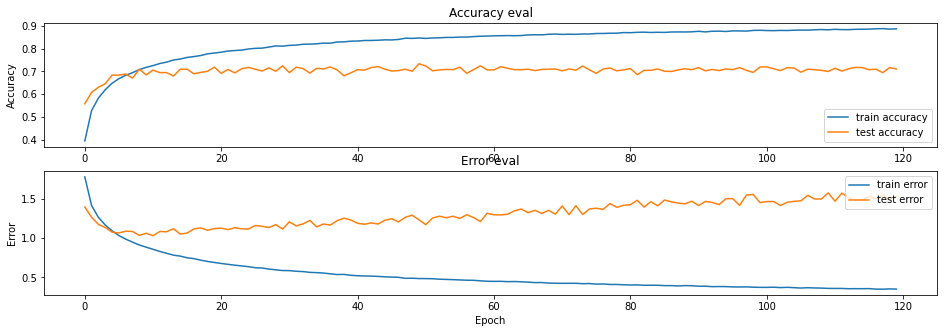

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_augmented_train, y_augmented_train, X_val, y_val, X_test, y_test)

1500/1500 - 17s - loss: 0.2231 - accuracy: 0.9345
Train loss    : 0.2231326848268509
Train accuracy: 0.9344672560691833

32/32 - 0s - loss: 1.5324 - accuracy: 0.7110
Val loss    : 1.5323870182037354
Val accuracy: 0.7110000252723694

32/32 - 0s - loss: 1.1776 - accuracy: 0.7470
Test loss     : 1.1776256561279297
Test accuracy : 0.746999979019165


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.70      0.77      0.73       100
   classical       0.90      0.92      0.91       100
     country       0.67      0.56      0.61       100
      hiphop       0.79      0.74      0.76       100
       disco       0.75      0.65      0.70       100
       metal       0.78      0.85      0.81       100
        jazz       0.86      0.89      0.87       100
         pop       0.71      0.82      0.76       100
      reggae       0.80      0.75      0.77       100
        rock       0.51      0.52      0.52       100

    accuracy                           0.75      1000
   macro avg       0.75      0.75      0.75      1000
weighted avg       0.75      0.75      0.75      1000



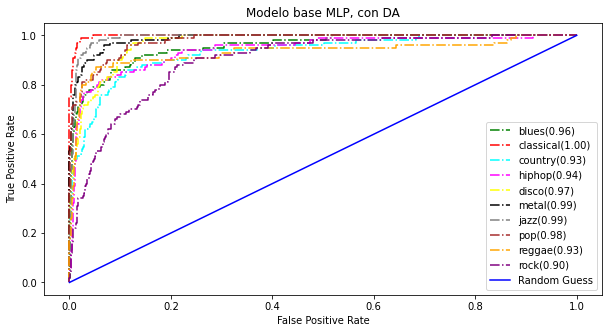

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo CNN, con DA")

#### Modelo CNN Avanzado (MFCCs)

##### Sin Audio Data Augmentation

In [ ]:
# SIN AUDIO DATA AUGMENTATION
# Cargamos el fichero g de train generado en nuestra sesion de Colab
genres_train, X_train, y_train, y_train_str = load_data(JSON_PATH + "/train/train_" + JSON_FILENAME)
 
# Cargamos el fichero g de val generado en nuestra sesion de Colab
genres_val, X_val, y_val, y_val_str = load_data(JSON_PATH + "/val/val_" + JSON_FILENAME)
 
# Cargamos el fichero g de test generado en nuestra sesion de Colab
genres_test, X_test, y_test, y_test_str = load_data(JSON_PATH + "/test/test_" + JSON_FILENAME)

In [ ]:
# Expandimos dimension dummy necesaria para las capas convolucionales en Keras
X_train = X_train[..., np.newaxis]
X_val = X_val[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [ ]:
# Definimos forma de la entrada
input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
X_train.shape

(7996, 130, 13, 1)

In [ ]:
X_val.shape

(1000, 130, 13, 1)

In [ ]:
X_test.shape

(1000, 130, 13, 1)

In [35]:
# Definimos arquitectura de la red
model = Sequential()

model.add(Conv2D(64, kernel_size=(3,3), strides=(2,2), padding='same', input_shape=input_shape))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
model.add(Dropout(0.3))
model.add(BatchNormalization())

model.add(Conv2D(64, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
model.add(Dropout(0.3))
model.add(BatchNormalization())

model.add(Conv2D(128, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
model.add(Dropout(0.4))
model.add(BatchNormalization())

model.add(Conv2D(256, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
model.add(Dropout(0.5))
model.add(BatchNormalization())

model.add(Conv2D(128, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
model.add(Dropout(0.4))
model.add(BatchNormalization())

model.add(Conv2D(64, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(GlobalMaxPool2D())
model.add(Dropout(0.3))
model.add(BatchNormalization())

model.add(Flatten())
model.add(Dense(64, kernel_regularizer=l2(0.001)))
model.add(LeakyReLU())
model.add(Dropout(0.3))

#model.add(Dense(32, kernel_regularizer=l2(0.001)))
#model.add(LeakyReLU())
#model.add(Dropout(0.3))

model.add(Dense(10, activation='softmax'))

# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
             optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              #optimizer = Adam(learning_rate=0.0001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 65, 7, 64)         640       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 65, 7, 64)         0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 33, 4, 64)         0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 33, 4, 64)         0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 33, 4, 64)         256       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 17, 2, 64)         36928     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 17, 2, 64)        

In [ ]:
# Entrenamos el modelo
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=120, batch_size=32, shuffle=True)

Epoch 1/120
250/250 [==============================] - 4s 8ms/step - loss: 2.8033 - accuracy: 0.1089 - val_loss: 2.2758 - val_accuracy: 0.1650
Epoch 2/120
250/250 [==============================] - 2s 7ms/step - loss: 2.4541 - accuracy: 0.1780 - val_loss: 2.0448 - val_accuracy: 0.2940
Epoch 3/120
250/250 [==============================] - 2s 7ms/step - loss: 2.2383 - accuracy: 0.2404 - val_loss: 1.9308 - val_accuracy: 0.3210
Epoch 4/120
250/250 [==============================] - 2s 7ms/step - loss: 2.0686 - accuracy: 0.2877 - val_loss: 1.8733 - val_accuracy: 0.3500
Epoch 5/120
250/250 [==============================] - 2s 7ms/step - loss: 1.9882 - accuracy: 0.2959 - val_loss: 1.8214 - val_accuracy: 0.3760
Epoch 6/120
250/250 [==============================] - 2s 7ms/step - loss: 1.8748 - accuracy: 0.3314 - val_loss: 1.7849 - val_accuracy: 0.3760
Epoch 7/120
250/250 [==============================] - 2s 7ms/step - loss: 1.7770 - accuracy: 0.3512 - val_loss: 1.7112 - val_accuracy: 0.3530

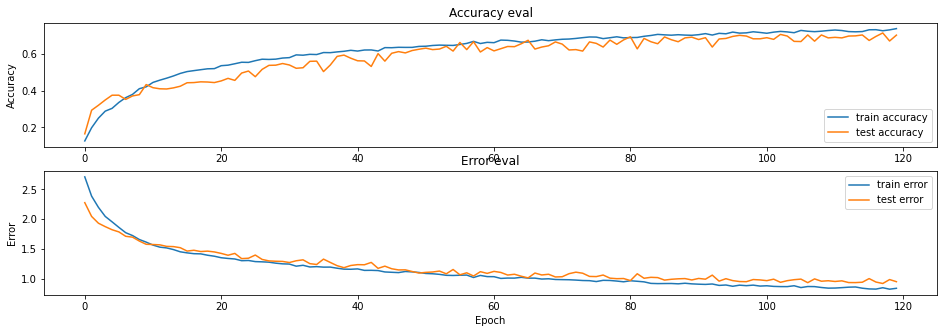

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_train, y_train, X_val, y_val, X_test, y_test)

250/250 - 1s - loss: 0.5242 - accuracy: 0.8558
Train loss    : 0.5242226123809814
Train accuracy: 0.8558028936386108

32/32 - 0s - loss: 1.0047 - accuracy: 0.6890
Val loss    : 1.004662275314331
Val accuracy: 0.6890000104904175

32/32 - 0s - loss: 0.9157 - accuracy: 0.7100
Test loss     : 0.9157370924949646
Test accuracy : 0.7099999785423279


In [ ]:

# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))


              precision    recall  f1-score   support

       blues       0.58      0.74      0.65       100
   classical       0.94      0.85      0.89       100
     country       0.56      0.57      0.56       100
      hiphop       0.77      0.65      0.71       100
       disco       0.75      0.63      0.68       100
       metal       0.91      0.85      0.88       100
        jazz       0.82      0.89      0.85       100
         pop       0.90      0.62      0.73       100
      reggae       0.66      0.80      0.72       100
        rock       0.42      0.50      0.45       100

    accuracy                           0.71      1000
   macro avg       0.73      0.71      0.71      1000
weighted avg       0.73      0.71      0.71      1000



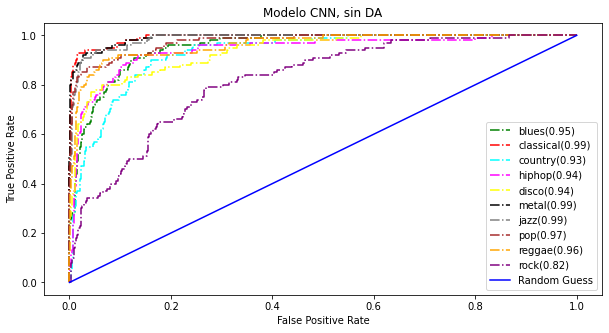

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo CNN, sin DA")

##### Con Audio Data Augmentation

In [ ]:
X_augmented_train.shape

(47976, 130, 13, 1)

In [ ]:
# CON AUDIO DATA AUGMENTATION
# Cargamos el fichero MFCCs de train generado en nuestra sesion de Colab
genres_augmented_train, X_augmented_train, y_augmented_train, y_augmented_train_str = load_data(JSON_PATH + "/train/augmented_train_" + JSON_FILENAME)

In [ ]:
# Expandimos dimension dummy necesaria para las capas convolucionales en Keras
X_augmented_train = X_augmented_train[..., np.newaxis]

# Definimos forma de la entrada
input_shape = (X_augmented_train.shape[1], X_augmented_train.shape[2], X_augmented_train.shape[3])
X_augmented_train.shape

(47976, 130, 13, 1)

In [ ]:
# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
             optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              #optimizer = Adam(learning_rate=0.0001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_112 (Conv2D)          (None, 65, 7, 64)         640       
_________________________________________________________________
leaky_re_lu_122 (LeakyReLU)  (None, 65, 7, 64)         0         
_________________________________________________________________
max_pooling2d_91 (MaxPooling (None, 33, 4, 64)         0         
_________________________________________________________________
dropout_128 (Dropout)        (None, 33, 4, 64)         0         
_________________________________________________________________
batch_normalization_112 (Bat (None, 33, 4, 64)         256       
_________________________________________________________________
conv2d_113 (Conv2D)          (None, 17, 2, 64)         36928     
_________________________________________________________________
leaky_re_lu_123 (LeakyReLU)  (None, 17, 2, 64)       

In [ ]:
# Entrenamos el modelo
history = model.fit(X_augmented_train, y_augmented_train, validation_data=(X_val, y_val), epochs=250, batch_size=32, shuffle=True)

Epoch 1/250
1500/1500 [==============================] - 11s 6ms/step - loss: 2.4810 - accuracy: 0.1709 - val_loss: 1.7322 - val_accuracy: 0.4170
Epoch 2/250
1500/1500 [==============================] - 10s 6ms/step - loss: 1.9459 - accuracy: 0.3049 - val_loss: 1.5865 - val_accuracy: 0.5050
Epoch 3/250
1500/1500 [==============================] - 9s 6ms/step - loss: 1.7664 - accuracy: 0.3747 - val_loss: 1.4697 - val_accuracy: 0.5380
Epoch 4/250
1500/1500 [==============================] - 10s 6ms/step - loss: 1.6579 - accuracy: 0.4260 - val_loss: 1.4489 - val_accuracy: 0.5430
Epoch 5/250
1500/1500 [==============================] - 10s 7ms/step - loss: 1.5941 - accuracy: 0.4500 - val_loss: 1.4290 - val_accuracy: 0.5440
Epoch 6/250
1500/1500 [==============================] - 10s 6ms/step - loss: 1.5395 - accuracy: 0.4757 - val_loss: 1.3943 - val_accuracy: 0.5570
Epoch 7/250
1500/1500 [==============================] - 10s 6ms/step - loss: 1.4944 - accuracy: 0.4947 - val_loss: 1.3448 - 

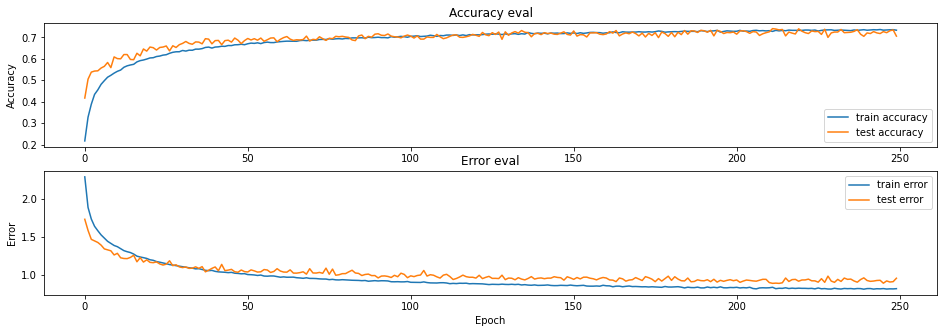

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_augmented_train, y_augmented_train, X_val, y_val, X_test, y_test)

1500/1500 - 3s - loss: 0.6457 - accuracy: 0.8135
Train loss    : 0.6457331776618958
Train accuracy: 0.8135108947753906

32/32 - 0s - loss: 0.9713 - accuracy: 0.6970
Val loss    : 0.971264123916626
Val accuracy: 0.6970000267028809

32/32 - 0s - loss: 0.8523 - accuracy: 0.7260
Test loss     : 0.8522815704345703
Test accuracy : 0.7260000109672546


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.72      0.63      0.67       100
   classical       0.92      0.88      0.90       100
     country       0.53      0.63      0.57       100
      hiphop       0.75      0.63      0.68       100
       disco       0.88      0.80      0.84       100
       metal       0.88      0.84      0.86       100
        jazz       0.91      0.69      0.78       100
         pop       0.80      0.84      0.82       100
      reggae       0.65      0.85      0.74       100
        rock       0.41      0.47      0.44       100

    accuracy                           0.73      1000
   macro avg       0.74      0.73      0.73      1000
weighted avg       0.74      0.73      0.73      1000



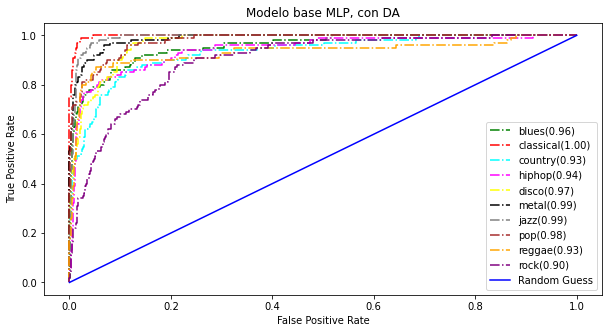

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo base MLP, con DA")

#### Modelo CNN (Espectrogramas PNG)

Probamos el **modelo CNN avanzado anterior con las imágenes de los espectrogramas** a ver cuál es su performance.


##### Sin Audio Data Augmentation 

In [ ]:
# Definimos directorios para los generadores
train_data_dir = PNG_PATH + "/train/initial_data"
val_data_dir = PNG_PATH + "/val"
test_data_dir = PNG_PATH + "/test"

In [ ]:
# Como todas las imágenes tienen el mismo tamaño no se reescalan
batch_size = 32

# Dimensiones a las que vamos a llevar las imágenes
normed_dims = PNG_SHAPE[0:2]

# Definimos forma de la entrada
#Añadimos dimension de canal RGB
input_shape = PNG_SHAPE
input_shape

(288, 432, 3)

In [ ]:
# Se definen los conjuntos de train, val y test
preprocess_input = lambda x:x/255.

train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function = preprocess_input,
    shear_range=0.2,       #to apply some random tranfromations
    zoom_range=0.2,        #to apply zoom
    horizontal_flip=True   # image will be flipper horiztest_datagen = ImageDataGenerator(rescale=1./255)
)

val_datagen  = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

test_datagen = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=normed_dims, 
    batch_size=batch_size,
    shuffle=True,
    class_mode='sparse') # binary, categorical, sparse

validation_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='sparse') # binary, categorical, sparse

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='sparse') # binary, categorical, sparse

Found 800 images belonging to 10 classes.
Found 100 images belonging to 10 classes.
Found 100 images belonging to 10 classes.


In [ ]:
train_generator.class_indices

{'blues': 0,
 'classical': 1,
 'country': 2,
 'disco': 3,
 'hiphop': 4,
 'jazz': 5,
 'metal': 6,
 'pop': 7,
 'reggae': 8,
 'rock': 9}

In [ ]:
number_train_samples = train_generator.n
number_val_samples   = validation_generator.n
number_test_samples  = test_generator.n

number_train_samples, number_val_samples, number_test_samples

(800, 100, 100)

In [ ]:
# Definimos arquitectura de la red
model = Sequential()

model.add(Conv2D(64, kernel_size=(3,3), strides=(2,2), padding='same', input_shape=input_shape))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
#model.add(Dropout(0.3))
model.add(BatchNormalization())

model.add(Conv2D(64, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
#model.add(Dropout(0.3))
model.add(BatchNormalization())

model.add(Conv2D(128, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
#model.add(Dropout(0.4))
model.add(BatchNormalization())

model.add(Conv2D(256, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
#model.add(Dropout(0.5))
model.add(BatchNormalization())

model.add(Conv2D(128, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(MaxPooling2D((2, 2), strides=(2, 2), padding="same"))
#model.add(Dropout(0.4))
model.add(BatchNormalization())

model.add(Conv2D(64, kernel_size=(3,3), strides=(2,2), padding='same'))
model.add(LeakyReLU())
model.add(GlobalMaxPool2D())
#model.add(Dropout(0.3))
model.add(BatchNormalization())

model.add(Flatten())
model.add(Dense(64, kernel_regularizer=l2(0.001)))
model.add(LeakyReLU())
model.add(Dropout(0.3))

#model.add(Dense(32, kernel_regularizer=l2(0.001)))
#model.add(LeakyReLU())
#model.add(Dropout(0.3))

model.add(Dense(10, activation='softmax'))

# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
             optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              #optimizer = Adam(learning_rate=0.0001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 144, 216, 64)      1792      
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 144, 216, 64)      0         
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 72, 108, 64)       0         
_________________________________________________________________
batch_normalization_14 (Batc (None, 72, 108, 64)       256       
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 36, 54, 64)        36928     
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 36, 54, 64)        0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 18, 27, 64)       

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=number_train_samples // batch_size,
    epochs=60,
    validation_data=validation_generator,
    validation_steps=number_val_samples // batch_size
)

Epoch 1/60
25/25 [==============================] - 66s 2s/step - loss: 2.7026 - accuracy: 0.1297 - val_loss: 2.3683 - val_accuracy: 0.1042
Epoch 2/60
25/25 [==============================] - 62s 2s/step - loss: 2.3322 - accuracy: 0.2283 - val_loss: 2.3703 - val_accuracy: 0.0938
Epoch 3/60
25/25 [==============================] - 62s 2s/step - loss: 2.0895 - accuracy: 0.2815 - val_loss: 2.3726 - val_accuracy: 0.1042
Epoch 4/60
25/25 [==============================] - 62s 2s/step - loss: 1.9394 - accuracy: 0.3051 - val_loss: 2.3783 - val_accuracy: 0.1042
Epoch 5/60
25/25 [==============================] - 64s 3s/step - loss: 1.9654 - accuracy: 0.3325 - val_loss: 2.3846 - val_accuracy: 0.1042
Epoch 6/60
25/25 [==============================] - 63s 2s/step - loss: 1.8056 - accuracy: 0.3743 - val_loss: 2.3999 - val_accuracy: 0.1042
Epoch 7/60
25/25 [==============================] - 62s 2s/step - loss: 1.6967 - accuracy: 0.4352 - val_loss: 2.4284 - val_accuracy: 0.1042
Epoch 8/60
25/25 [==

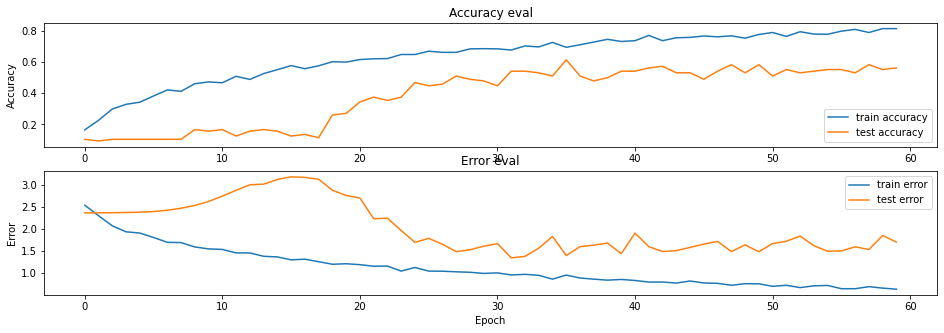

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
scores_tr = model.evaluate(train_generator)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

25/25 [==============================] - 36s 1s/step - loss: 0.5663 - accuracy: 0.8288
Train loss    : 0.5662774443626404
Train accuracy: 0.8287500143051147

4/4 [==============================] - 2s 402ms/step - loss: 1.7955 - accuracy: 0.5400
Val loss    : 1.7955389022827148
Val accuracy: 0.5400000214576721

4/4 [==============================] - 56s 19s/step - loss: 1.3928 - accuracy: 0.5900
Test loss     : 1.3927998542785645
Test accuracy : 0.5899999737739563


In [ ]:
# Classification Report
y_real = test_generator.classes
y_pred_proba = model.predict(test_generator)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_real, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.35      0.70      0.47        10
   classical       0.82      0.90      0.86        10
     country       0.54      0.70      0.61        10
      hiphop       0.48      1.00      0.65        10
       disco       1.00      0.60      0.75        10
       metal       1.00      0.50      0.67        10
        jazz       0.00      0.00      0.00        10
         pop       0.86      0.60      0.71        10
      reggae       0.62      0.80      0.70        10
        rock       0.25      0.10      0.14        10

    accuracy                           0.59       100
   macro avg       0.59      0.59      0.55       100
weighted avg       0.59      0.59      0.55       100



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


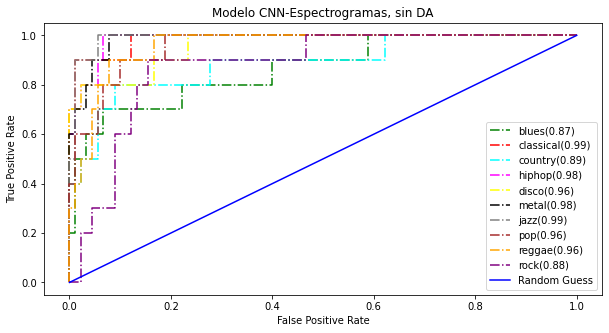

In [ ]:
# Curvas ROC
plot_auc(y_real, y_pred_proba, genres_test, "Modelo CNN-Espectrogramas, sin DA")

##### Con Audio Data Augmentation

In [ ]:
# Definimos directorios para los generadores
train_data_dir = PNG_PATH + "/train/augmented_data"

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=normed_dims, 
    batch_size=batch_size,
    shuffle=True,
    class_mode='sparse') # binary, categorical, sparse

validation_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='sparse') # binary, categorical, sparse

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='sparse') # binary, categorical, sparse

Found 4800 images belonging to 10 classes.
Found 100 images belonging to 10 classes.
Found 100 images belonging to 10 classes.


In [ ]:
number_train_samples = train_generator.n
number_val_samples   = validation_generator.n
number_test_samples  = test_generator.n

number_train_samples, number_val_samples, number_test_samples

(4800, 100, 100)

In [ ]:
# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
             optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              #optimizer = Adam(learning_rate=0.0001),
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 144, 216, 64)      1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 144, 216, 64)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 72, 108, 64)       0         
_________________________________________________________________
batch_normalization (BatchNo (None, 72, 108, 64)       256       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 36, 54, 64)        36928     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 36, 54, 64)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 18, 27, 64)        0

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=number_train_samples // batch_size,
    epochs=60,
    validation_data=validation_generator,
    validation_steps=number_val_samples // batch_size
)

Epoch 1/60
150/150 [==============================] - 1714s 11s/step - loss: 2.2671 - accuracy: 0.2241 - val_loss: 2.3800 - val_accuracy: 0.1042
Epoch 2/60
150/150 [==============================] - 130s 863ms/step - loss: 1.7431 - accuracy: 0.3947 - val_loss: 2.5051 - val_accuracy: 0.1875
Epoch 3/60
150/150 [==============================] - 129s 857ms/step - loss: 1.5207 - accuracy: 0.4840 - val_loss: 2.2710 - val_accuracy: 0.3021
Epoch 4/60
150/150 [==============================] - 129s 859ms/step - loss: 1.3619 - accuracy: 0.5336 - val_loss: 2.0915 - val_accuracy: 0.3750
Epoch 5/60
150/150 [==============================] - 128s 853ms/step - loss: 1.2558 - accuracy: 0.5686 - val_loss: 1.8149 - val_accuracy: 0.4375
Epoch 6/60
150/150 [==============================] - 129s 859ms/step - loss: 1.1610 - accuracy: 0.6076 - val_loss: 1.8594 - val_accuracy: 0.4062
Epoch 7/60
150/150 [==============================] - 128s 854ms/step - loss: 1.0531 - accuracy: 0.6622 - val_loss: 1.7572 - 

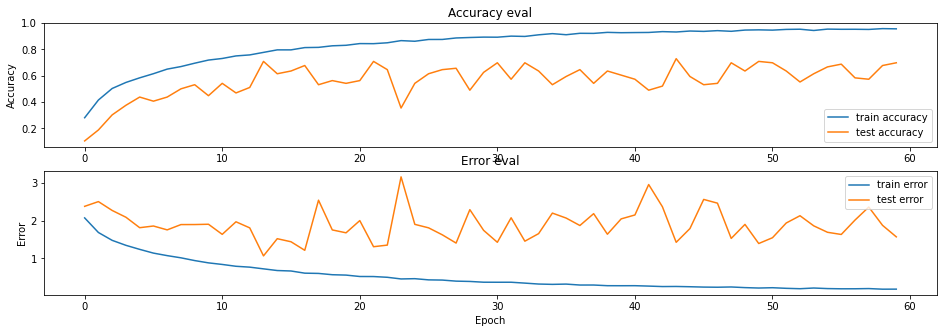

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
scores_tr = model.evaluate(train_generator)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

150/150 [==============================] - 127s 845ms/step - loss: 0.1232 - accuracy: 0.9802
Train loss    : 0.12320063263177872
Train accuracy: 0.9802083373069763

4/4 [==============================] - 1s 174ms/step - loss: 1.7397 - accuracy: 0.6800
Val loss    : 1.7397114038467407
Val accuracy: 0.6800000071525574

4/4 [==============================] - 28s 9s/step - loss: 1.1116 - accuracy: 0.7500
Test loss     : 1.11164128780365
Test accuracy : 0.75


In [ ]:
# Classification Report
y_real = test_generator.classes
y_pred_proba = model.predict(test_generator)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_real, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.47      0.90      0.62        10
   classical       0.89      0.80      0.84        10
     country       0.69      0.90      0.78        10
      hiphop       0.91      1.00      0.95        10
       disco       0.78      0.70      0.74        10
       metal       0.77      1.00      0.87        10
        jazz       1.00      0.50      0.67        10
         pop       0.70      0.70      0.70        10
      reggae       1.00      0.80      0.89        10
        rock       0.67      0.20      0.31        10

    accuracy                           0.75       100
   macro avg       0.79      0.75      0.74       100
weighted avg       0.79      0.75      0.74       100



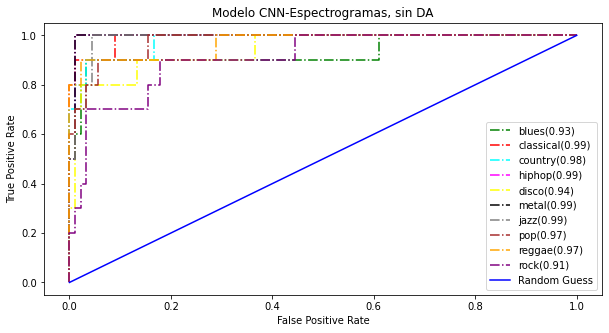

In [ ]:
# Curvas ROC
plot_auc(y_real, y_pred_proba, genres_test, "Modelo CNN-Espectrogramas, sin DA")

## Clasificacion con LSTM

VER A comparativeanalysis of CNN andLSTM for musicgenre classification

#### Modelo LSTM (MFCCs)

##### Sin Audio Data Augmentation

In [37]:
# SIN AUDIO DATA AUGMENTATION
# Cargamos el fichero g de train generado en nuestra sesion de Colab
genres_train, X_train, y_train, y_train_str = load_data(JSON_PATH + "/train/train_" + JSON_FILENAME)

# Cargamos el fichero g de val generado en nuestra sesion de Colab
genres_val, X_val, y_val, y_val_str = load_data(JSON_PATH + "/val/val_" + JSON_FILENAME)

# Cargamos el fichero g de test generado en nuestra sesion de Colab
genres_test, X_test, y_test, y_test_str = load_data(JSON_PATH + "/test/test_" + JSON_FILENAME)

In [38]:
# Definimos forma de la entrada
# 130, 13
input_shape = (X_train.shape[1], X_train.shape[2])
input_shape

(130, 13)

In [39]:
# Definimos la arquitectura de la red
model = Sequential()

model.add(LSTM(128, input_shape=input_shape, return_sequences=True))# (timesteps, data_dim) returns a sequence of vectors of dimension 64
model.add(Dropout(0.5))

model.add(LSTM(64, return_sequences=True))
model.add(Dropout(0.3))

model.add(LSTM(64))
model.add(Dropout(0.3))

model.add(Flatten())
model.add(Dense(64, kernel_regularizer=l2(0.001)))
model.add(LeakyReLU())
model.add(Dropout(0.3))

model.add(Dense(10, activation='softmax'))

# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
#              optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              optimizer = Adam(learning_rate=0.001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 130, 128)          72704     
_________________________________________________________________
dropout_27 (Dropout)         (None, 130, 128)          0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 130, 64)           49408     
_________________________________________________________________
dropout_28 (Dropout)         (None, 130, 64)           0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 64)                33024     
_________________________________________________________________
dropout_29 (Dropout)         (None, 64)                0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 64)              

In [ ]:
# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
#              optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              optimizer = Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
# Entrenamos el modelo
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=60, batch_size=32, shuffle=True)

Epoch 1/60
250/250 [==============================] - 9s 23ms/step - loss: 1.9271 - accuracy: 0.3225 - val_loss: 1.6126 - val_accuracy: 0.4550
Epoch 2/60
250/250 [==============================] - 5s 19ms/step - loss: 1.4436 - accuracy: 0.4996 - val_loss: 1.4553 - val_accuracy: 0.4930
Epoch 3/60
250/250 [==============================] - 5s 19ms/step - loss: 1.3073 - accuracy: 0.5566 - val_loss: 1.3738 - val_accuracy: 0.5290
Epoch 4/60
250/250 [==============================] - 5s 19ms/step - loss: 1.2435 - accuracy: 0.5783 - val_loss: 1.4205 - val_accuracy: 0.5120
Epoch 5/60
250/250 [==============================] - 5s 19ms/step - loss: 1.1111 - accuracy: 0.6279 - val_loss: 1.4482 - val_accuracy: 0.5330
Epoch 6/60
250/250 [==============================] - 5s 19ms/step - loss: 1.0977 - accuracy: 0.6356 - val_loss: 1.3690 - val_accuracy: 0.5630
Epoch 7/60
250/250 [==============================] - 5s 19ms/step - loss: 0.9719 - accuracy: 0.6869 - val_loss: 1.3836 - val_accuracy: 0.5480

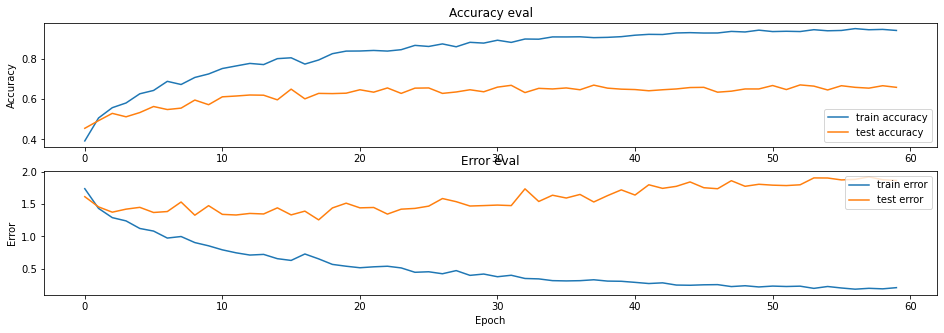

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_train, y_train, X_val, y_val, X_test, y_test)

250/250 - 2s - loss: 0.1259 - accuracy: 0.9635
Train loss    : 0.1258816421031952
Train accuracy: 0.9634817242622375

32/32 - 0s - loss: 1.8630 - accuracy: 0.6580
Val loss    : 1.8629586696624756
Val accuracy: 0.6579999923706055

32/32 - 0s - loss: 1.6526 - accuracy: 0.6680
Test loss     : 1.6526223421096802
Test accuracy : 0.6679999828338623


In [ ]:
# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))

              precision    recall  f1-score   support

       blues       0.85      0.56      0.67       100
   classical       0.99      0.84      0.91       100
     country       0.50      0.65      0.56       100
      hiphop       0.67      0.61      0.64       100
       disco       0.52      0.55      0.53       100
       metal       0.74      0.79      0.76       100
        jazz       0.67      0.87      0.76       100
         pop       0.79      0.85      0.82       100
      reggae       0.66      0.65      0.65       100
        rock       0.40      0.31      0.35       100

    accuracy                           0.67      1000
   macro avg       0.68      0.67      0.67      1000
weighted avg       0.68      0.67      0.67      1000



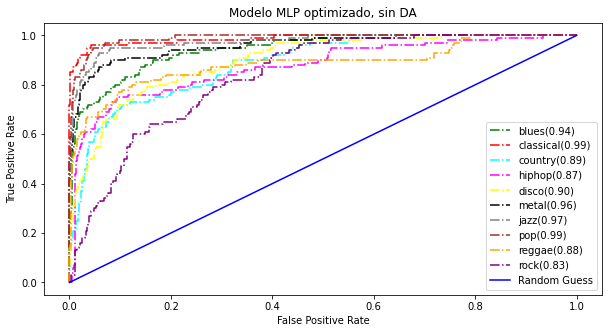

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo MLP optimizado, sin DA")

##### Con Audio Data Augmentation

In [ ]:
# CON AUDIO DATA AUGMENTATION
# Cargamos el fichero MFCCs de train generado en nuestra sesion de Colab
genres_augmented_train, X_augmented_train, y_augmented_train, y_augmented_train_str = load_data(JSON_PATH + "/train/augmented_train_" + JSON_FILENAME)

In [ ]:
# Definimos forma de la entrada
# 130, 13
input_shape = (X_augmented_train.shape[1], X_augmented_train.shape[2])
input_shape

(130, 13)

In [ ]:
# Compilamos modelo
model.compile(loss="sparse_categorical_crossentropy",
#              optimizer=RMSprop(lr=1e-4),
#              optimizer=RMSprop(),
              optimizer = Adam(learning_rate=0.001),
              metrics=['accuracy'])

model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 130, 128)          72704     
_________________________________________________________________
dropout_8 (Dropout)          (None, 130, 128)          0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 130, 64)           49408     
_________________________________________________________________
dropout_9 (Dropout)          (None, 130, 64)           0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 64)                33024     
_________________________________________________________________
dropout_10 (Dropout)         (None, 64)                0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 64)               

In [ ]:
# Entrenamos el modelo
history = model.fit(X_augmented_train, y_augmented_train, validation_data=(X_val, y_val), epochs=60, batch_size=32, shuffle=True)

Epoch 1/60
1500/1500 [==============================] - 31s 19ms/step - loss: 1.8017 - accuracy: 0.3663 - val_loss: 1.5088 - val_accuracy: 0.5030
Epoch 2/60
1500/1500 [==============================] - 27s 18ms/step - loss: 1.3750 - accuracy: 0.5297 - val_loss: 1.4722 - val_accuracy: 0.5470
Epoch 3/60
1500/1500 [==============================] - 27s 18ms/step - loss: 1.1909 - accuracy: 0.5967 - val_loss: 1.4068 - val_accuracy: 0.5970
Epoch 4/60
1500/1500 [==============================] - 27s 18ms/step - loss: 1.0437 - accuracy: 0.6578 - val_loss: 1.3788 - val_accuracy: 0.6180
Epoch 5/60
1500/1500 [==============================] - 27s 18ms/step - loss: 0.9259 - accuracy: 0.6953 - val_loss: 1.3264 - val_accuracy: 0.6410
Epoch 6/60
1500/1500 [==============================] - 27s 18ms/step - loss: 0.8522 - accuracy: 0.7245 - val_loss: 1.4136 - val_accuracy: 0.6410
Epoch 7/60
1500/1500 [==============================] - 27s 18ms/step - loss: 0.7804 - accuracy: 0.7499 - val_loss: 1.3636 -

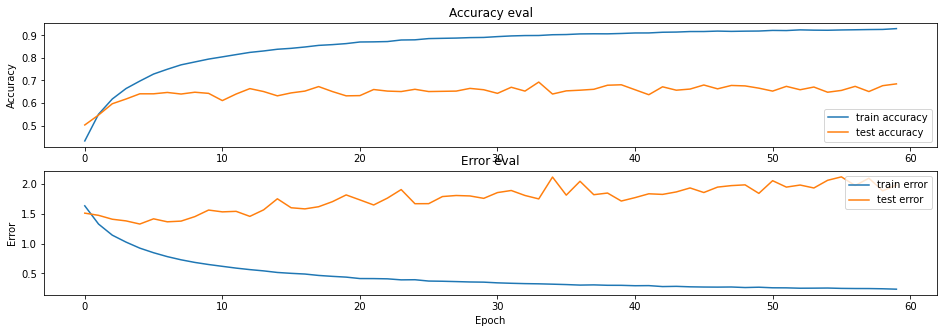

In [ ]:
# Ploteamos metricas y error
plot_history(history)

In [ ]:
# Resultados train/val/test
show_scores(X_augmented_train, y_augmented_train, X_val, y_val, X_test, y_test)

1500/1500 - 11s - loss: 0.1825 - accuracy: 0.9428
Train loss    : 0.1824696958065033
Train accuracy: 0.942804753780365

32/32 - 0s - loss: 1.9801 - accuracy: 0.6850
Val loss    : 1.9801316261291504
Val accuracy: 0.6850000023841858

32/32 - 0s - loss: 1.6683 - accuracy: 0.7120
Test loss     : 1.668341875076294
Test accuracy : 0.7120000123977661


In [ ]:

# Classification Report
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
print(classification_report(y_test, y_pred, target_names=genres_test))


              precision    recall  f1-score   support

       blues       0.75      0.71      0.73       100
   classical       0.88      0.87      0.87       100
     country       0.61      0.63      0.62       100
      hiphop       0.62      0.67      0.64       100
       disco       0.69      0.64      0.66       100
       metal       0.84      0.85      0.85       100
        jazz       0.80      0.78      0.79       100
         pop       0.75      0.87      0.81       100
      reggae       0.76      0.71      0.74       100
        rock       0.42      0.39      0.40       100

    accuracy                           0.71      1000
   macro avg       0.71      0.71      0.71      1000
weighted avg       0.71      0.71      0.71      1000



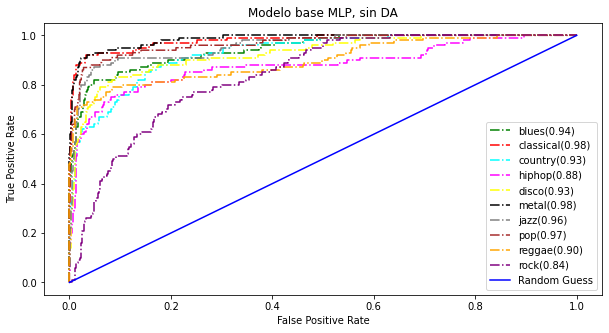

In [ ]:
# Curvas ROC
plot_auc(y_test, y_pred_proba, genres_test, "Modelo base MLP, sin DA")

# Conclusiones
Los resultados obtenidos están muy limitados y condicionados por las restricciones del propio conjunto de datos utilizado. Es un conjunto de datos muy pequeño (*solo 1000 fragmentos de canciones*) y se presentan 10 clases diferentes, lo que deja solamente 100 muestras por clase. 

Además tras revisar muy superficialmente algunas canciones aleatorias de cada dataset he encontrado que algunas canciones podrían clasificarse mejor (*por ejemplo AC/DC está incluído en la carpeta de "metal", cuando bajo mi punto de vista debería haber ido a la carpeta "rock"*), esto podría "confundir" a la red al encontrar patrones similares en varias carpetas debido a la inclusión de muestras en carpetas que se podrían haber incluido en otras de forma más correcta. 

Otro detalle puede ser el sesgo dado por un artista: esto es, que haya muchas canciones de un mismo artista en una carpeta: por ejemplo en la carpeta "reggae" muchas de las muestras son de Bob Marley.

De todos modos para este problema de Music Information Retrieval los resultados obtenidos son aceptables comparándolos con el estado del arte actual en la materia. Además, el fin de este trabajo es poner en práctica muchos de los conceptos y técnicas vistas en clase para imágenes y series temporales y mi intención era poder ponerlos en práctica desde otro tipo de origen diferente (audio) donde se pudieran poner a modo de comparación 3 tipos de redes diferentes.

## Ideas para mejorar los resultados obtenidos:
- Probar con las imagenes de las representaciones de los MFCCs en la CNN de imágenes
- Normalizar entradas.
- Usar LR variable.
- Probar con la onda (raw) como entrada directa, dividida en segmentos.
- Probar convoluciones en 1D en las CNNs.
- Recopilar más muestras de canciones de otros datasets (FMA Dataset... etc) normalizando datos.
- Explorar más trasnformaciones de data augmentation
- Probar otros optimizadores.
- Incluir otras características para enriquecer el dataset aparte de las MFCCs como Cromas, Centroides espectrales, 0-crossing rates... etc.
- Probar con distintos # coeficientes MFCC.
- Probar modelos híbridos con la API funcional donde se combinen varias de las redes vistas pudiendo integrar los dos inputs vistos en una misma red.
- Probar Transfer Learning.
- Devolver un ranking con los estilos más probables: esto nos puede dar una idea de si una canción por ejemplo puede presentar una mezcla de estilos en diferentes puntos del tiempo, para ello también se podría analizar las canciones por segmentos, pero sabiendo qué segmentos provienen de la misma canción.


# Referencias
1. Logan, Beth. (2000). *Mel Frequency Cepstral Coefficients for Music Modeling.* - Proc. 1st Int. Symposium Music Information Retrieval. http://ismir2000.ismir.net/papers/logan_paper.pdf
2. GTZAN Dataset - G. Tzanetakis and P. Cook (2002) - *Musical genre classification of audio signals* - IEEE Transactions on Audio and Speech Processing 2002. http://marsyas.info/downloads/datasets.html
3. Valerio Velardo - *Deep Learning (for Audio) with Python.*<BR>https://www.youtube.com/playlist?list=PL-wATfeyAMNrtbkCNsLcpoAyBBRJZVlnf

4. Mignot, R., & Peeters, G. (2019). *An Analysis of the Effect of Data Augmentation Methods:
Experiments for a Musical Genre Classification Task.* - Transactions of the International Society
for Music Information Retrieval, 2(1), pp. 97–110.<BR>https://www.researchgate.net/publication/338029829_An_Analysis_of_the_Effect_of_Data_Augmentation_Methods_Experiments_for_a_Musical_Genre_Classification_Task

5. Bian, Wenhao & Jie, Wang & Zhuang, Bojin & Yang, Jiankui & Wang, Shaojun & Xiao, Jing. (2019). *Audio-Based Music Classification with DenseNet And Data Augmentation.* https://arxiv.org/pdf/1906.11620.pdf

6. Gessle, Gabriel and Simon Åkesson (2019). *A comparative analysis of CNN and LSTM for music genre classification*. <BR>http://kth.diva-portal.org/smash/get/diva2:1354738/FULLTEXT01.pdf

7. McFee, Brian, Colin Raffel, Dawen Liang, Daniel PW Ellis, Matt McVicar, Eric Battenberg, and Oriol Nieto. - *LibROSA: Audio and music signal analysis in python. In Proceedings of the 14th python in science conference, pp. 18-25. 2015*.<BR>https://librosa.org/

8. Johannes Filter - *Split folders with files (e.g. images) into training, validation and test (dataset) folders (split-folders 0.4.3).* https://pypi.org/project/split-folders/

9. Iver Jordal - *audiomentations A Python library for audio data augmentation (audiomentations 0.16.0).*<BR>https://pypi.org/project/audiomentations/
